In [10]:
#Importing Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import joblib
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest
from lime.lime_tabular import LimeTabularExplainer
from sklearn.naive_bayes import GaussianNB
from sklearn.feature_selection import f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, classification_report
from sklearn.svm import SVC
import xgboost as xgb
import lime
import lime.lime_tabular
from sklearn import svm
from sklearn.metrics import auc
from sklearn import metrics
from sklearn.pipeline import Pipeline
from scipy.stats import loguniform
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm as svm_model
from sklearn.metrics import classification_report,  roc_curve,accuracy_score, precision_score, recall_score, f1_score, confusion_matrix,roc_auc_score


In [11]:
pip install lime

# EXPLORATORY DATA ANALYSIS

In [12]:
# Reading the dataset
file_path = file_path = r"C:\Users\opeye\OneDrive - Teesside University\DISSERTATION\Cardiovascular_Disease_Dataset.csv"

Cardiovascular = pd.read_csv(file_path)

# Previewing the first 5 rows
Cardiovascular.head()


,patientid,age,gender,chestpain,restingBP,serumcholestrol,fastingbloodsugar,restingrelectro,maxheartrate,exerciseangia,oldpeak,slope,noofmajorvessels,target
0,103368,53,1,2,171,0,0,1,147,0,5.3,3,3,1
1,119250,40,1,0,94,229,0,1,115,0,3.7,1,1,0
2,119372,49,1,2,133,142,0,0,202,1,5.0,1,0,0
3,132514,43,1,0,138,295,1,1,153,0,3.2,2,2,1
4,146211,31,1,1,199,0,0,2,136,0,5.3,3,2,1


In [13]:
#Previewing the last 5 rows
Cardiovascular.tail()

,patientid,age,gender,chestpain,restingBP,serumcholestrol,fastingbloodsugar,restingrelectro,maxheartrate,exerciseangia,oldpeak,slope,noofmajorvessels,target
995,9949544,48,1,2,139,349,0,2,183,1,5.6,2,2,1
996,9953423,47,1,3,143,258,1,1,98,1,5.7,1,0,0
997,9965859,69,1,0,156,434,1,0,196,0,1.4,3,1,1
998,9988507,45,1,1,186,417,0,1,117,1,5.9,3,2,1
999,9990855,25,1,0,158,270,0,0,143,1,4.7,0,0,0


In [14]:
#Viewing the rows and features
Cardiovascular.shape

(1000, 14)

In [15]:
#viewing the summary of the dataframe
Cardiovascular.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   patientid          1000 non-null   int64  
 1   age                1000 non-null   int64  
 2   gender             1000 non-null   int64  
 3   chestpain          1000 non-null   int64  
 4   restingBP          1000 non-null   int64  
 5   serumcholestrol    1000 non-null   int64  
 6   fastingbloodsugar  1000 non-null   int64  
 7   restingrelectro    1000 non-null   int64  
 8   maxheartrate       1000 non-null   int64  
 9   exerciseangia      1000 non-null   int64  
 10  oldpeak            1000 non-null   float64
 11  slope              1000 non-null   int64  
 12  noofmajorvessels   1000 non-null   int64  
 13  target             1000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 109.5 KB


In [7]:
#checking the null values of each feature
Cardiovascular.isnull().sum()

patientid            0
age                  0
gender               0
chestpain            0
restingBP            0
serumcholestrol      0
fastingbloodsugar    0
restingrelectro      0
maxheartrate         0
exerciseangia        0
oldpeak              0
slope                0
noofmajorvessels     0
target               0
dtype: int64

In [82]:
#printing the columns
print(Cardiovascular.columns)

Index(['patientid', 'age', 'gender', 'chestpain', 'restingBP',
       'serumcholestrol', 'fastingbloodsugar', 'restingrelectro',
       'maxheartrate', 'exerciseangia', 'oldpeak', 'slope', 'noofmajorvessels',
       'target'],
      dtype='object')


# EXPLORATION DATA ANALYSIS

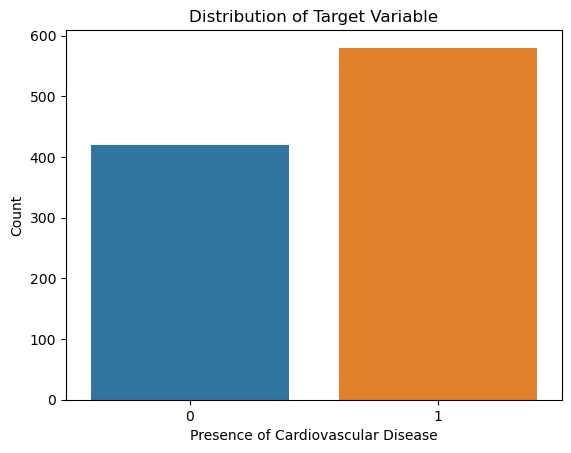

In [16]:
# Plotting the distribution of the target variable
sns.countplot(x='target', data=Cardiovascular)
plt.title('Distribution of Target Variable')
plt.xlabel('Presence of Cardiovascular Disease')
plt.ylabel('Count')
plt.show()


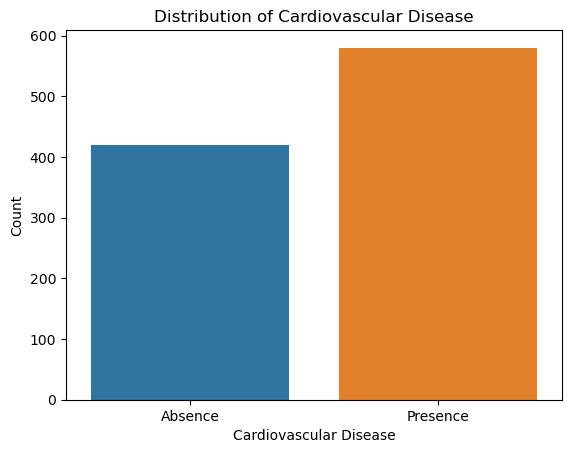

In [17]:
# Plotting the distribution of the target variable
ax = sns.countplot(x='target', data=Cardiovascular)
ax.set_title('Distribution of Cardiovascular Disease')
ax.set_xlabel('Cardiovascular Disease')
ax.set_ylabel('Count')

# Setting the custom tick labels
ax.set_xticks([0, 1])
ax.set_xticklabels(['Absence', 'Presence'])

plt.show()


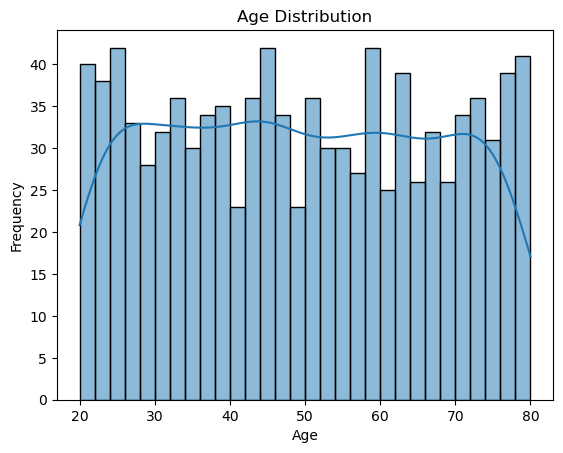

In [18]:
# Plotting the age distribution
sns.histplot(Cardiovascular['age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()


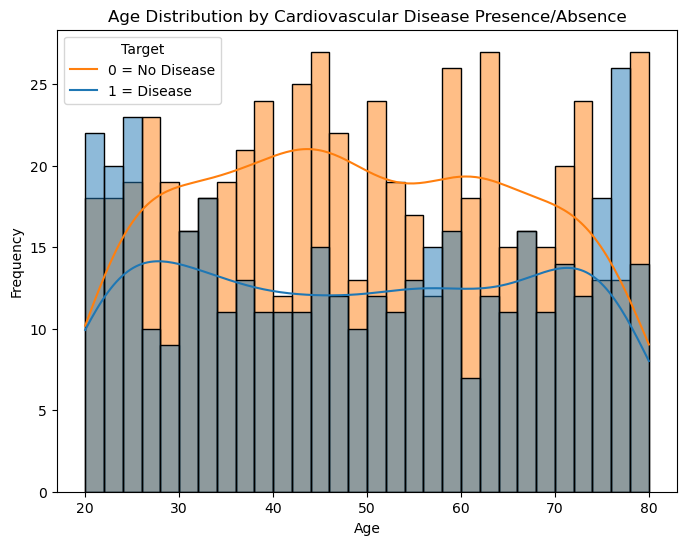

In [19]:
# Plotting the age distribution by the cardiovascular disease
plt.figure(figsize=(8, 6))
sns.histplot(data=Cardiovascular, x="age", hue="target", kde=True, bins=30, alpha=0.5)
plt.title("Age Distribution by Cardiovascular Disease Presence/Absence")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.legend(title="Target", labels=["0 = No Disease", "1 = Disease"])
plt.show()


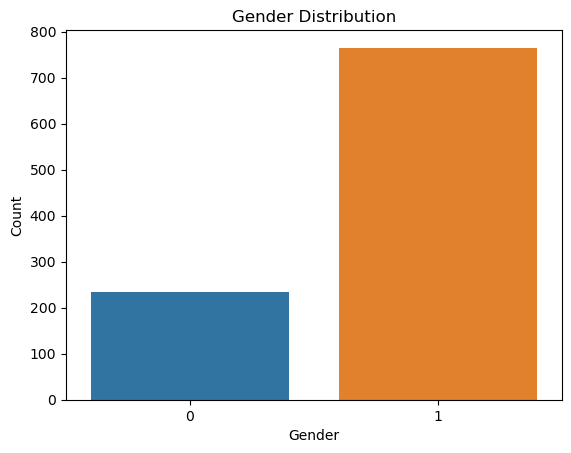

In [20]:
# Plotting the gender distribution
sns.countplot(x='gender', data=Cardiovascular)
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()


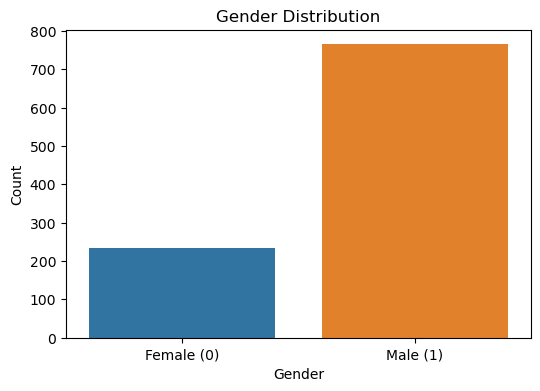

In [21]:
# Plot the gender distribution
plt.figure(figsize=(6, 4))
ax = sns.countplot(x='gender', data=Cardiovascular)
ax.set_title('Gender Distribution')
ax.set_xlabel('Gender')
ax.set_ylabel('Count')

# Setting the custom x-axis labels
ax.set_xticklabels(['Female (0)', 'Male (1)'])

plt.show()


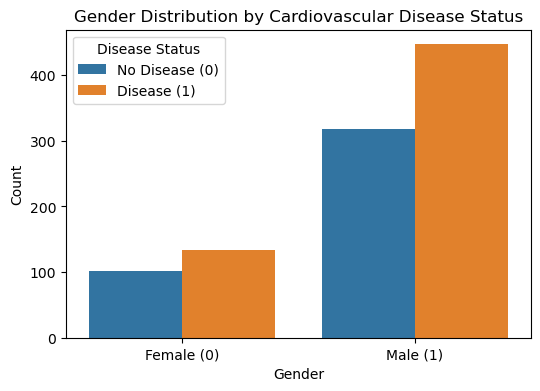

In [22]:
# Plotting gender distribution by disease status
plt.figure(figsize=(6, 4))
sns.countplot(x='gender', hue='target', data=Cardiovascular, palette=['#1f77b4', '#ff7f0e'])
plt.title('Gender Distribution by Cardiovascular Disease Status')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Female (0)', 'Male (1)'])
plt.legend(title='Disease Status', labels=['No Disease (0)', 'Disease (1)'])
plt.show()


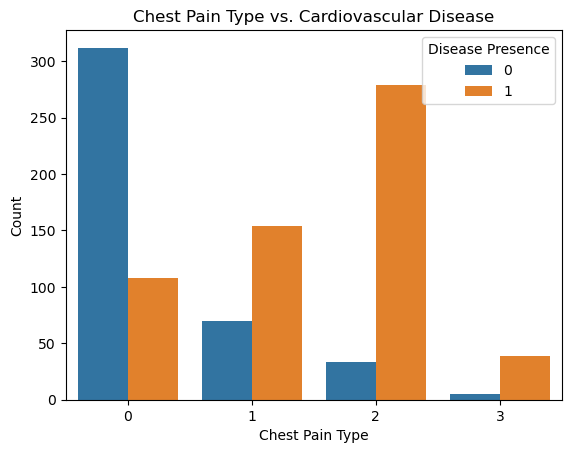

In [15]:
# Plot chest pain type against the target variable
sns.countplot(x='chestpain', hue='target', data=Cardiovascular)
plt.title('Chest Pain Type vs. Cardiovascular Disease')
plt.xlabel('Chest Pain Type')
plt.ylabel('Count')
plt.legend(title='Disease Presence', loc='upper right')
plt.show()


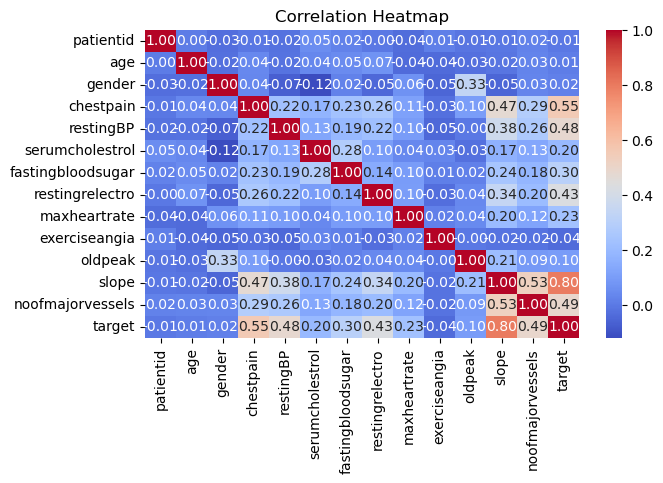

In [23]:
# Compute the correlation matrix
corr_matrix = Cardiovascular.corr()

# Plot the heatmap
plt.figure(figsize=(7, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


C:\Users\opeye\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


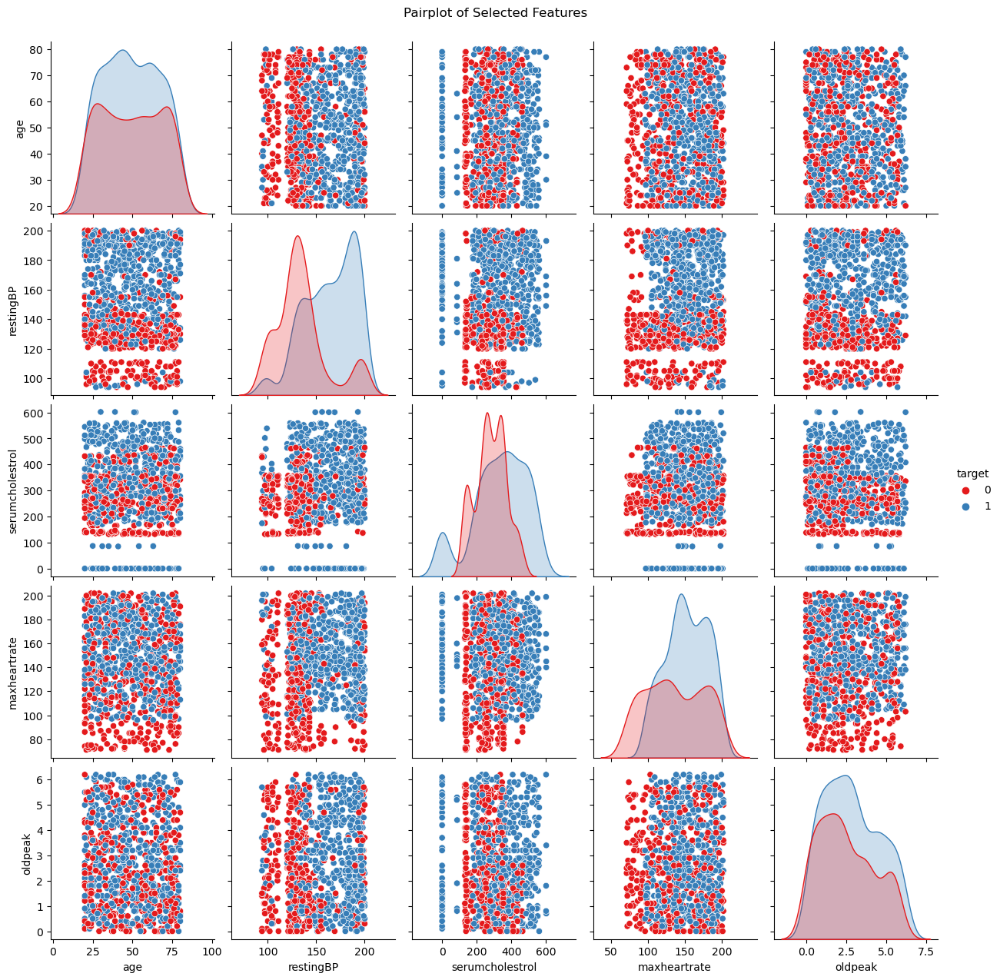

In [24]:
# Select features for pairplot
selected_features = ['age', 'restingBP', 'serumcholestrol', 'maxheartrate', 'oldpeak', 'target']

# Plot pairplot
sns.pairplot(Cardiovascular[selected_features], hue='target', palette='Set1')
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()


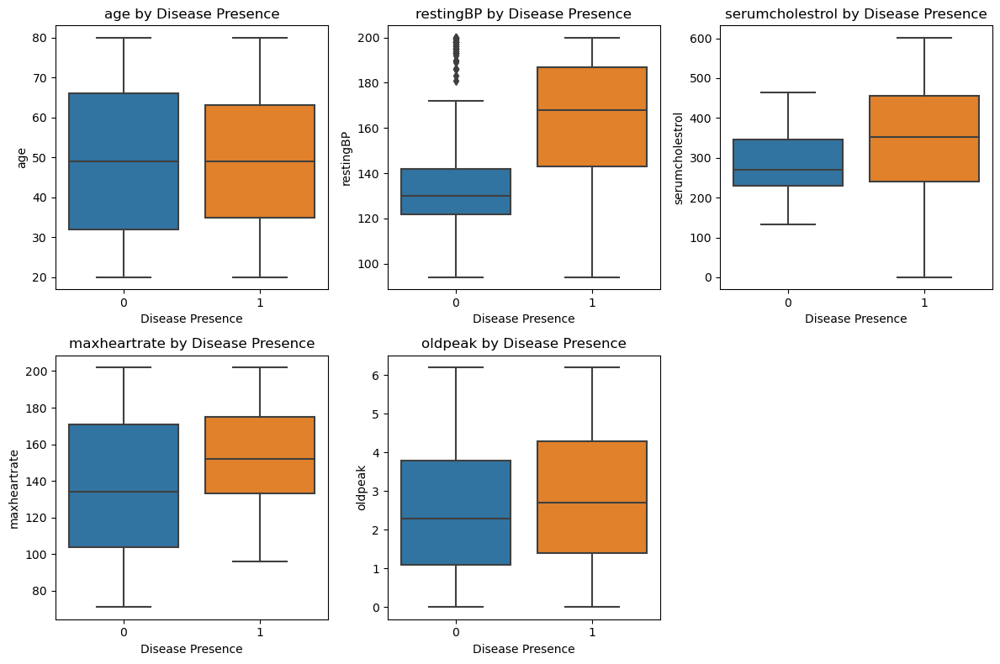

In [25]:
# Continuous variables
continuous_vars = ['age', 'restingBP', 'serumcholestrol', 'maxheartrate', 'oldpeak']

# Plot boxplots
plt.figure(figsize=(12, 8))
for i, var in enumerate(continuous_vars, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x='target', y=var, data=Cardiovascular)
    plt.title(f'{var} by Disease Presence')
    plt.xlabel('Disease Presence')
    plt.ylabel(var)
plt.tight_layout()
plt.show()


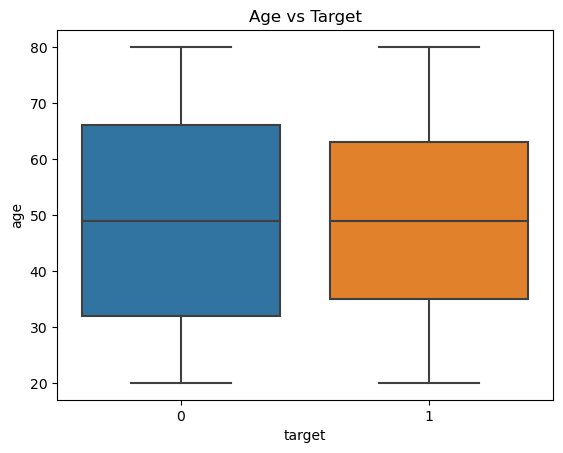

In [19]:
# Relationship between age and target
sns.boxplot(x='target', y='age', data=Cardiovascular)
plt.title('Age vs Target')
plt.show()

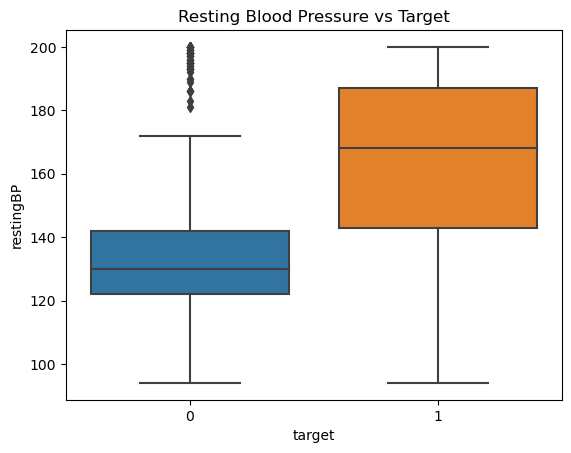

In [20]:
# Relationship between resting blood pressure and target
sns.boxplot(x='target', y='restingBP', data=Cardiovascular)
plt.title('Resting Blood Pressure vs Target')
plt.show()


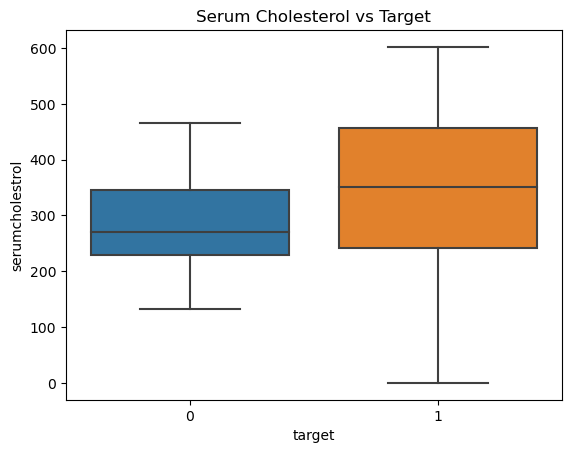

In [21]:
# Relationship between serum cholesterol and target
sns.boxplot(x='target', y='serumcholestrol', data=Cardiovascular)
plt.title('Serum Cholesterol vs Target')
plt.show()

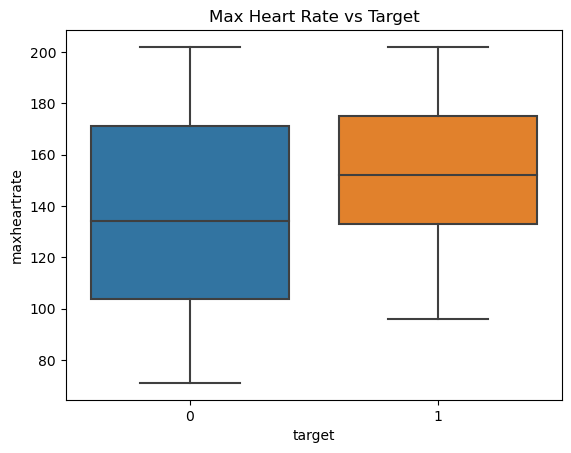

In [28]:
# Relationship between max heart rate and target
sns.boxplot(x='target', y='maxheartrate', data=Cardiovascular)
plt.title('Max Heart Rate vs Target')
plt.show()

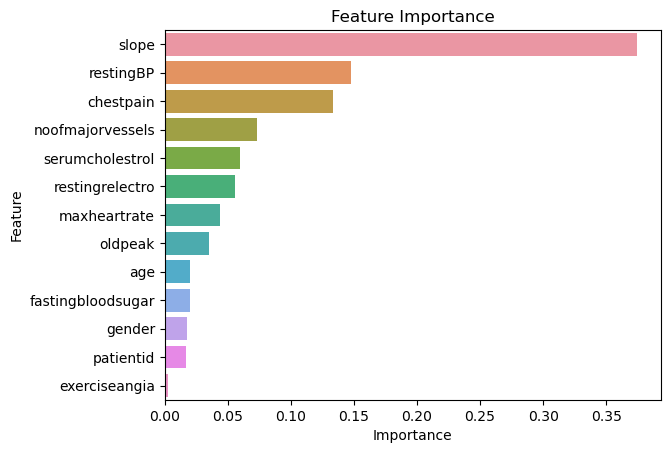

In [26]:
# Separating features and target
X = Cardiovascular.drop('target', axis=1)
y = Cardiovascular['target']

# Training a RandomForestClassifier to get feature importance
model = RandomForestClassifier()
model.fit(X, y)

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Creating a DataFrame for visualization
feature_importance_Cardiovascular = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_Cardiovascular = feature_importance_Cardiovascular.sort_values(by='Importance', ascending=False)

# Plotting the feature importances
sns.barplot(x='Importance', y='Feature', data=feature_importance_Cardiovascular)
plt.title('Feature Importance')
plt.show()


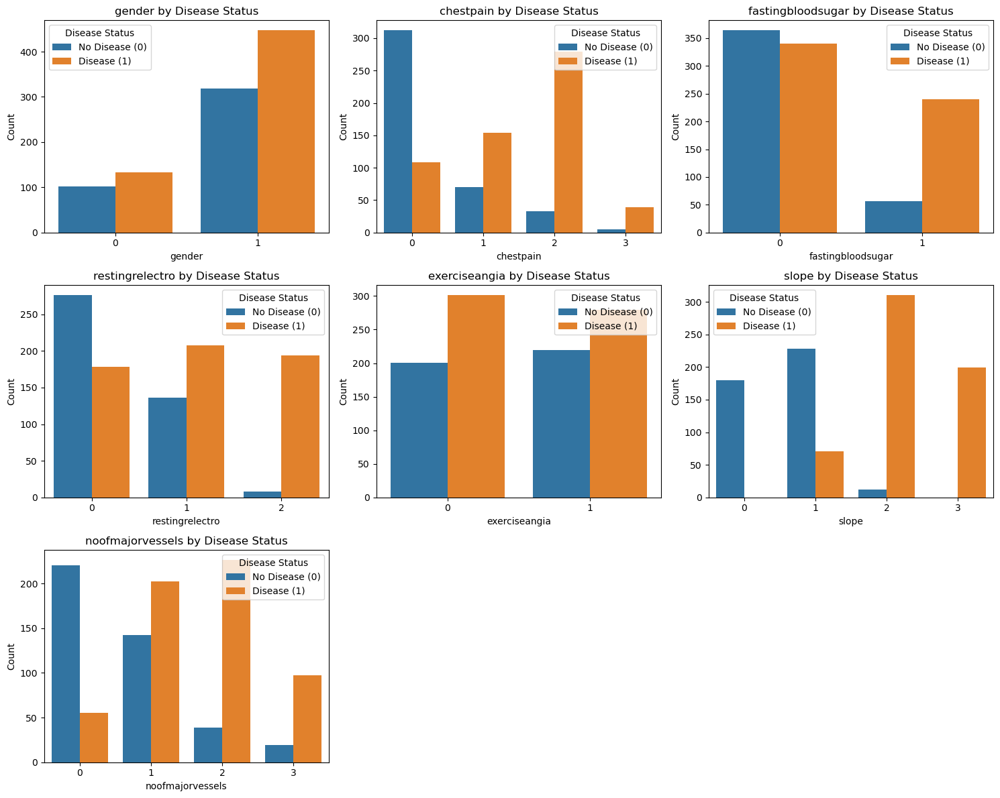

In [29]:
#Categorical variables to plot
categorical_vars = ['gender', 'chestpain', 'fastingbloodsugar', 'restingrelectro', 'exerciseangia', 'slope', 'noofmajorvessels']

#Plot countplots
plt.figure(figsize=(15, 12))
for i, var in enumerate(categorical_vars, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x=var, hue='target', data=Cardiovascular, palette=['#1f77b4', '#ff7f0e'])
    plt.title(f'{var} by Disease Status')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.legend(title='Disease Status', labels=['No Disease (0)', 'Disease (1)'])
plt.tight_layout()
plt.show()


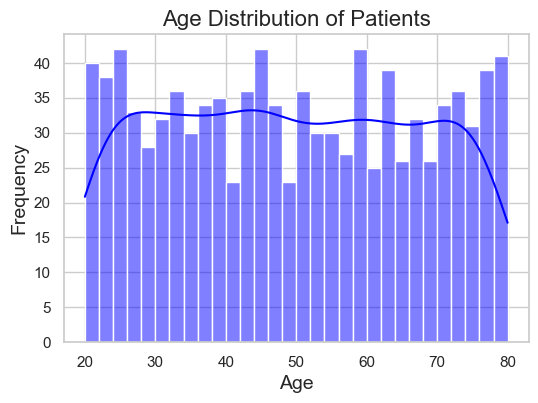

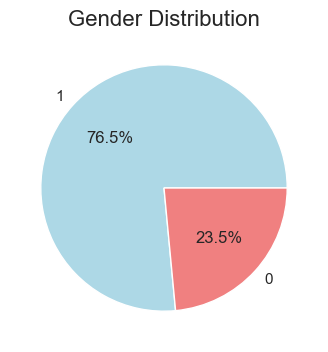

In [30]:

#Setting the aesthetic style of the plots
sns.set(style="whitegrid")

#Age Distribution
plt.figure(figsize=(6, 4))
sns.histplot(Cardiovascular['age'], kde=True, color='blue', bins=30)
plt.title('Age Distribution of Patients', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

#Gender Distribution
plt.figure(figsize=(4, 4))
gender_counts = Cardiovascular['gender'].value_counts()
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
plt.title('Gender Distribution', fontsize=16)
plt.show()

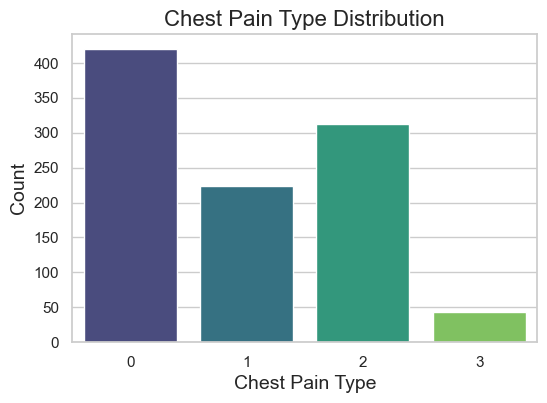

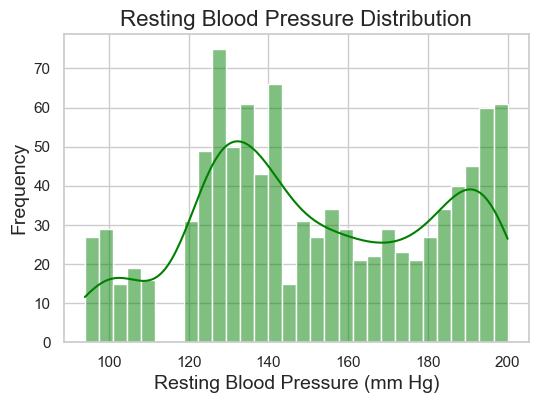

In [31]:
#Chest Pain Type Distribution

plt.figure(figsize=(6, 4))
sns.countplot(x='chestpain', data=Cardiovascular, palette='viridis')
plt.title('Chest Pain Type Distribution', fontsize=16)
plt.xlabel('Chest Pain Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

#Resting Blood Pressure Distribution
plt.figure(figsize=(6, 4))
sns.histplot(Cardiovascular['restingBP'], kde=True, color='green', bins=30)
plt.title('Resting Blood Pressure Distribution', fontsize=16)
plt.xlabel('Resting Blood Pressure (mm Hg)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

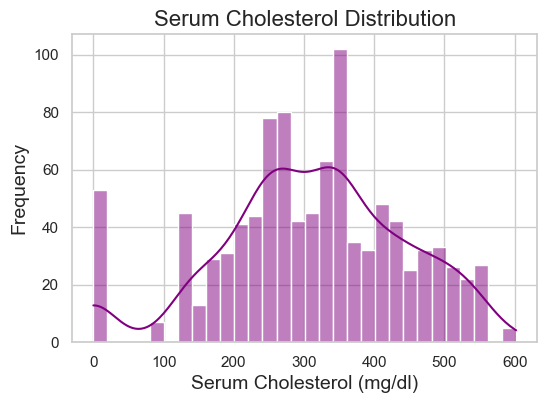

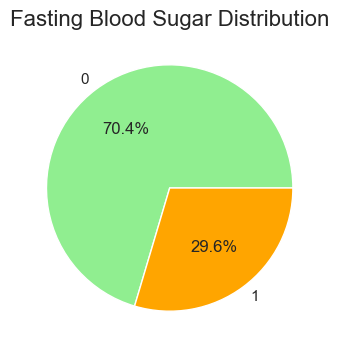

In [32]:
#Plotting Serum Cholesterol Distribution
plt.figure(figsize=(6, 4))
sns.histplot(Cardiovascular['serumcholestrol'], kde=True, color='purple', bins=30)
plt.title('Serum Cholesterol Distribution', fontsize=16)
plt.xlabel('Serum Cholesterol (mg/dl)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

#Plotting Fasting Blood Sugar Distribution
plt.figure(figsize=(4, 4))
fasting_sugar_counts = Cardiovascular['fastingbloodsugar'].value_counts()
plt.pie(fasting_sugar_counts, labels=fasting_sugar_counts.index, autopct='%1.1f%%', colors=['lightgreen', 'orange'])
plt.title('Fasting Blood Sugar Distribution', fontsize=16)
plt.show()

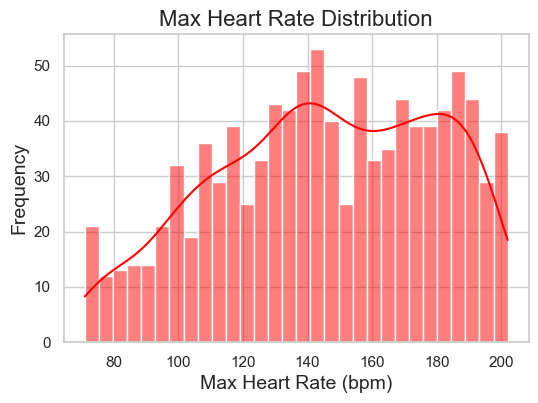

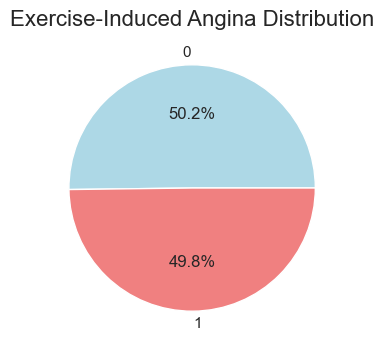

In [28]:
#Plotting Max Heart Rate Distribution
plt.figure(figsize=(6, 4))
sns.histplot(Cardiovascular['maxheartrate'], kde=True, color='red', bins=30)
plt.title('Max Heart Rate Distribution', fontsize=16)
plt.xlabel('Max Heart Rate (bpm)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# Plotting the Exercise-Induced Angina Distribution
plt.figure(figsize=(6, 4))
angina_counts = Cardiovascular['exerciseangia'].value_counts()
plt.pie(angina_counts, labels=angina_counts.index, autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
plt.title('Exercise-Induced Angina Distribution', fontsize=16)
plt.show()

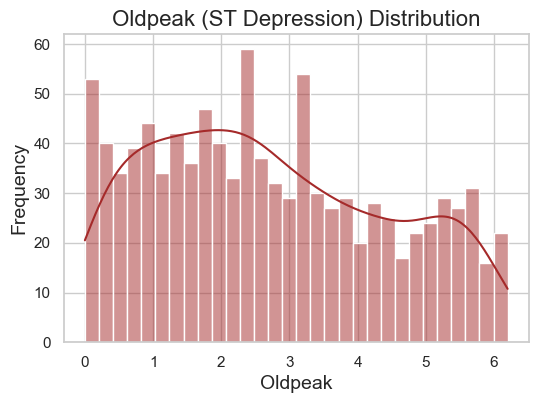

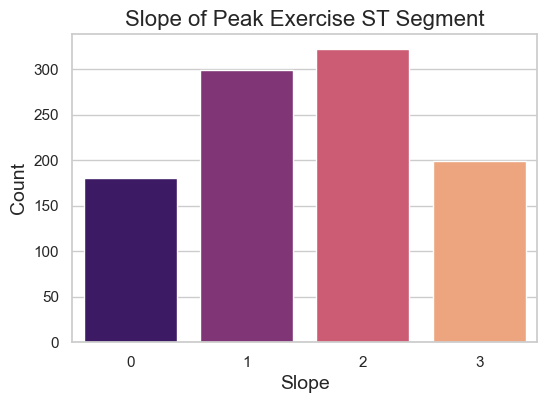

In [29]:
#Plotting the Oldpeak Distribution
plt.figure(figsize=(6, 4))
sns.histplot(Cardiovascular['oldpeak'], kde=True, color='brown', bins=30)
plt.title('Oldpeak (ST Depression) Distribution', fontsize=16)
plt.xlabel('Oldpeak', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

#Plotting Slope Distribution
plt.figure(figsize=(6, 4))
sns.countplot(x='slope', data=Cardiovascular, palette='magma')
plt.title('Slope of Peak Exercise ST Segment', fontsize=16)
plt.xlabel('Slope', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

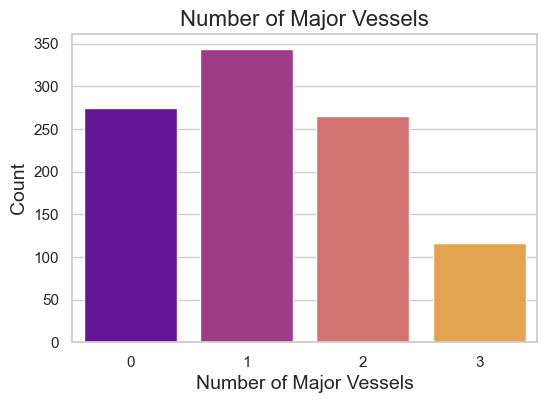

In [30]:
#Plotting Number of Major Vessels Distribution
plt.figure(figsize=(6, 4))
sns.countplot(x='noofmajorvessels', data=Cardiovascular, palette='plasma')
plt.title('Number of Major Vessels', fontsize=16)
plt.xlabel('Number of Major Vessels', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

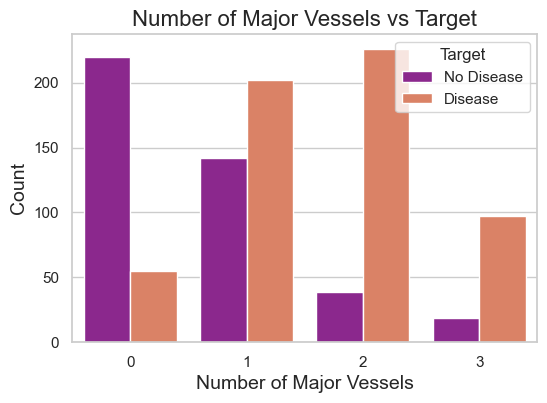

In [31]:
#Plotting the Number of Major Vessels Distribution against Target
plt.figure(figsize=(6, 4))
sns.countplot(x='noofmajorvessels', hue='target', data=Cardiovascular, palette='plasma')
plt.title('Number of Major Vessels vs Target', fontsize=16)
plt.xlabel('Number of Major Vessels', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Target', loc='upper right', labels=['No Disease', 'Disease'])
plt.show()

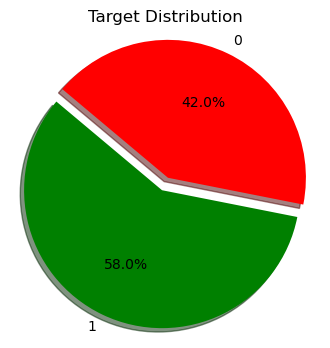

In [38]:
status_counts = Cardiovascular['target'].value_counts()

# Data to plot
labels = status_counts.index
sizes = status_counts.values
colors = ['green', 'red']  
explode = (0.1, 0)  

# Plotting the pie chart
plt.figure(figsize=(4, 4))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Target Distribution')

# Equal aspect ratio ensures that pie is drawn as a circle
plt.axis('equal')

# Show the plot
plt.show()


In [33]:
# Defining X and y
X = Cardiovascular.drop('target', axis=1)  # Replace 'target' with your actual label column
y = Cardiovascular['target']



# FEATURES ENCODING


In [34]:
#Dropping the 'patientid' column

#List of categorical features to encode
categorical_features = ['chestpain', 'restingrelectro', 'slope']

#Apply One-Hot Encoding to the categorical features
Cardiovascular = pd.get_dummies(Cardiovascular, columns=categorical_features, drop_first=True)

#Displaying the updated DataFrame
print(Cardiovascular.head())

   patientid  age  gender  restingBP  serumcholestrol  fastingbloodsugar  \
0     103368   53       1        171                0                  0   
1     119250   40       1         94              229                  0   
2     119372   49       1        133              142                  0   
3     132514   43       1        138              295                  1   
4     146211   31       1        199                0                  0   

   maxheartrate  exerciseangia  oldpeak  noofmajorvessels  target  \
0           147              0      5.3                 3       1   
1           115              0      3.7                 1       0   
2           202              1      5.0                 0       0   
3           153              0      3.2                 2       1   
4           136              0      5.3                 2       1   

   chestpain_1  chestpain_2  chestpain_3  restingrelectro_1  \
0        False         True        False               True   
1 

In [35]:
#Scaling numerical features only
numerical_cols = ['age', 'restingBP', 'serumcholestrol', 'maxheartrate', 'oldpeak']
scaler = StandardScaler()
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])




print("X shape:", X.shape)
print("Encoded columns:", list(X.columns))

X shape: (1000, 13)
Encoded columns: ['patientid', 'age', 'gender', 'chestpain', 'restingBP', 'serumcholestrol', 'fastingbloodsugar', 'restingrelectro', 'maxheartrate', 'exerciseangia', 'oldpeak', 'slope', 'noofmajorvessels']


In [92]:
#Dropping target safely
X = Cardiovascular.drop(columns=['target', 'patientid'])
y = Cardiovascular ['target']

#Checking the number of features
print("Columns in X:", X.columns.tolist())
print("Number of columns:", X.shape[1])


Columns in X: ['age', 'gender', 'chestpain', 'restingBP', 'serumcholestrol', 'fastingbloodsugar', 'restingrelectro', 'maxheartrate', 'exerciseangia', 'oldpeak', 'slope', 'noofmajorvessels']
Number of columns: 12


# SPLITTING AND TRAINING

In [36]:
#Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



# RANDOM FOREST

In [37]:
# Training the Random Forest model with the class weight 
model = RandomForestClassifier(random_state=42, class_weight="balanced")
model.fit(X_train, y_train)

# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))



Accuracy: 0.985

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98        83
           1       0.98      0.99      0.99       117

    accuracy                           0.98       200
   macro avg       0.99      0.98      0.98       200
weighted avg       0.99      0.98      0.98       200



In [38]:
# Training the Random Forest model without the class weight 
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))



Accuracy: 0.985

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98        83
           1       0.98      0.99      0.99       117

    accuracy                           0.98       200
   macro avg       0.99      0.98      0.98       200
weighted avg       0.99      0.98      0.98       200



In [39]:
# Calculate metrics
accuracy = accuracy_score(y_test, y_pred) * 100
f1 = f1_score(y_test, y_pred) * 100
recall = recall_score(y_test, y_pred) * 100
precision = precision_score(y_test, y_pred) * 100

# Print metrics
print("Accuracy = {:.2f}%".format(accuracy))
print("F1 Score = {:.2f}%".format(f1))
print("Recall = {:.2f}%".format(recall))
print("Precision = {:.2f}%".format(precision))

Accuracy = 98.50%
F1 Score = 98.72%
Recall = 99.15%
Precision = 98.31%


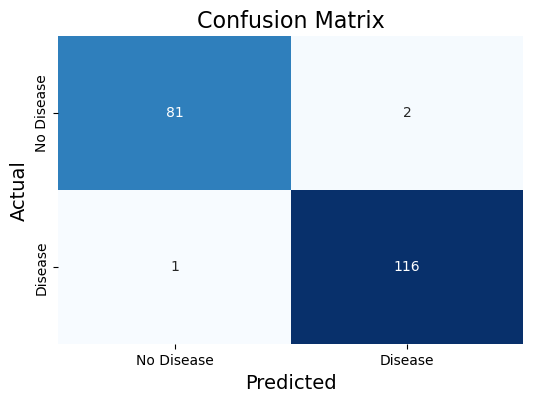

In [126]:
# Computing the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)
plt.show()

In [40]:
# Perform 5-fold cross-validation
cv_scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean Cross-Validation Accuracy:", cv_scores.mean())

Cross-Validation Accuracy Scores: [0.97  1.    0.945 0.985 0.965]
Mean Cross-Validation Accuracy: 0.9730000000000001


In [101]:
y_prob = model.predict_proba(X_test)[:, 1]  # Probabilities for class 1
print("AUC-ROC Score:", roc_auc_score(y_test, y_prob))

# Calculate AUC-ROC score
auc_score = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])

# Print the score
print("AUC-ROC Score:", auc_score)


AUC-ROC Score: 0.9998455359901142
AUC-ROC Score: 0.9998455359901142


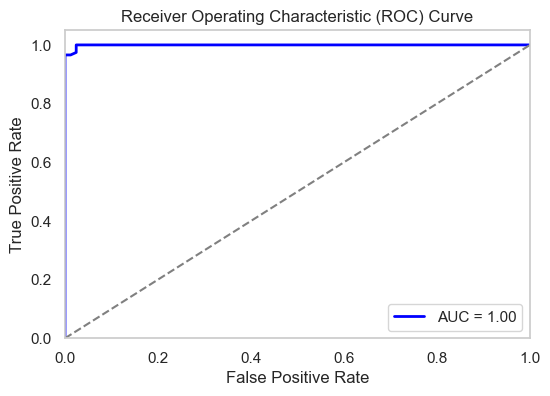

In [41]:
# Getting the predicted probabilities for the positive class
y_probs = model.predict_proba(X_test)[:, 1]

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_test, y_probs)

# Compute AUC score
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guessing line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid()
plt.show()


In [42]:
# Defining  the model
rf_model = RandomForestClassifier(random_state=42)

# Defining the parameter grid for tuning
param_grid = {
    'n_estimators': [50, 100, 200],          # Number of trees in the forest
    'max_depth': [None, 10, 20],             # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],         # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],           # Minimum samples required at each leaf node
    'bootstrap': [True, False]
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    scoring='accuracy',     
    cv=5,                   # 5-fold cross-validation
    n_jobs=-1,              # Use all available CPU cores
    verbose=2               
)

# Fiting the grid search on the training data
grid_search.fit(X_train, y_train)

# Printing the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Printing the best score achieved with these hyperparameters
print("Best Score:", grid_search.best_score_)

# Getting the best model
best_model = grid_search.best_estimator_

# Evaluation on the test set
test_accuracy = best_model.score(X_test, y_test)
print("Test Accuracy with Best Model:", test_accuracy)


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best Hyperparameters: {'bootstrap': False, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Score: 0.97875
Test Accuracy with Best Model: 0.995


In [43]:
# Saving the model
joblib.dump(model, 'cardiovascular_disease_model.pkl')

['cardiovascular_disease_model.pkl']

# LIME(Local Interpretable Model-agnostic Explanations)

In [104]:
# Fiting the model
rf_model.fit(X_train, y_train)
#Initializing the explainer using the full training data
explainer_rf = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,                       
    feature_names=X_train.columns.tolist(),             
    class_names=['No Disease', 'Disease'],
    mode='classification'
)

#Picking an instance to explain
i = 10  # Change index as needed
instance = X_test.iloc[i]

#Generating explanation using the full instance
exp_rf = explainer_rf.explain_instance(
    data_row=instance,
    predict_fn=rf_model.predict_proba,
    num_features=len(X.columns)  # Display all features
)

#Show explanation
exp_rf.show_in_notebook(show_table=True)


C:\Users\opeye\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


#  FEATURES IMPORTANCE

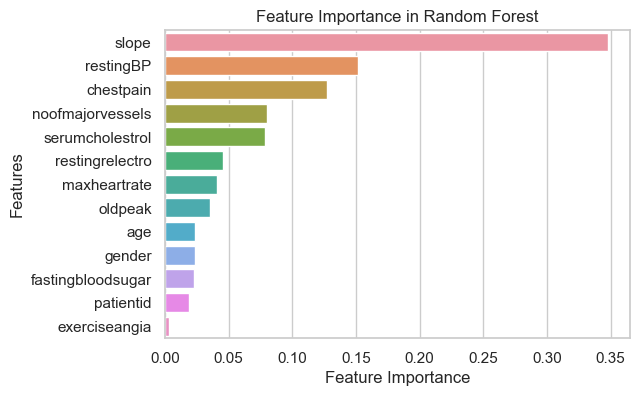

In [44]:
feature_importances = model.feature_importances_
feature_names = X_train.columns
sorted_indices = np.argsort(feature_importances)[::-1]

plt.figure(figsize=(6, 4))
sns.barplot(x=feature_importances[sorted_indices], y=[feature_names[i] for i in sorted_indices])
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Feature Importance in Random Forest")
plt.show()


# REMOVING LEAST IMPORTANT FEATURES

In [131]:
#Dropping the least important feature
X_drop = X.drop(columns=['exerciseangia'])

#splitting the dataset after dropping the least feature
X_drop_train, X_drop_test, y_drop_train, y_drop_test = train_test_split(
    X_drop, y, test_size=0.2, random_state=42
)

#Feature scaling
scaler = StandardScaler()
X_drop_train_scaled = scaler.fit_transform(X_drop_train)
X_drop_test_scaled = scaler.transform(X_drop_test)




In [132]:
# Initializing and training the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_drop_train, y_train)

# Make predictions
y_pred_rf = rf_model.predict(X_drop_test)

# Evaluating the model
print("Random Forest Model Performance (After Removing 'exerciseangia'):")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))


Random Forest Model Performance (After Removing 'exerciseangia'):
Accuracy: 0.9800

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.96      0.98        83
           1       0.97      0.99      0.98       117

    accuracy                           0.98       200
   macro avg       0.98      0.98      0.98       200
weighted avg       0.98      0.98      0.98       200



Random Forest Model Performance (After Removing 'exerciseangia'):
Accuracy: 0.9800
Precision: 0.9748
Recall: 0.9915
F1-Score: 0.9831

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.96      0.98        83
           1       0.97      0.99      0.98       117

    accuracy                           0.98       200
   macro avg       0.98      0.98      0.98       200
weighted avg       0.98      0.98      0.98       200



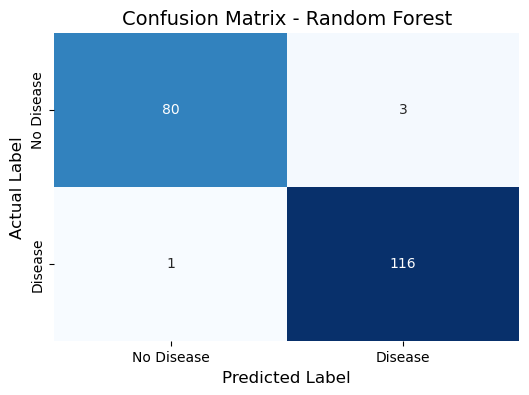

In [133]:
# Compute performance metrics
accuracy = accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)

# Printing performance metrics
print("Random Forest Model Performance (After Removing 'exerciseangia'):")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# Printing classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))

# Computing confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_rf)

# Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])

plt.title('Confusion Matrix - Random Forest', fontsize=14)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('Actual Label', fontsize=12)
plt.show()

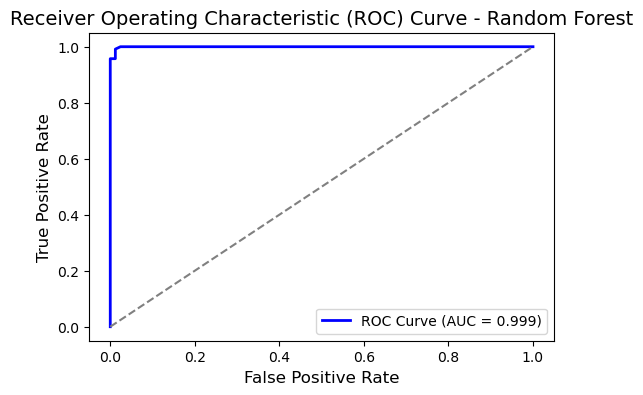

In [109]:
# Getting predicted probabilities for the positive class
y_pred_proba_rf = rf_model.predict_proba(X_drop_test)[:, 1]

# Computing ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_rf)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--') 
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic (ROC) Curve - Random Forest', fontsize=14)
plt.legend(loc='lower right')
plt.show()


In [110]:
# Save the model
joblib.dump(model, 'cardiovascular_disease_model.pkl')

['cardiovascular_disease_model.pkl']

# BALANCING DATASET

In [186]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


Accuracy: 0.9784
Precision: 0.9737
Recall: 0.9823
F1 Score: 0.9780
ROC AUC: 0.9992

Classification Report:
               precision    recall  f1-score   support

           0     0.9831    0.9748    0.9789       119
           1     0.9737    0.9823    0.9780       113

    accuracy                         0.9784       232
   macro avg     0.9784    0.9785    0.9784       232
weighted avg     0.9785    0.9784    0.9785       232



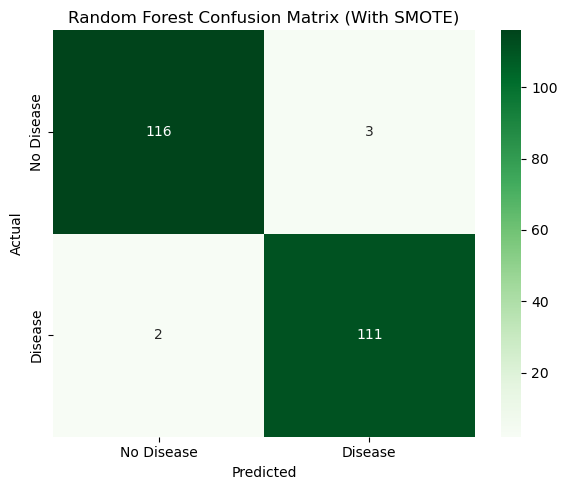

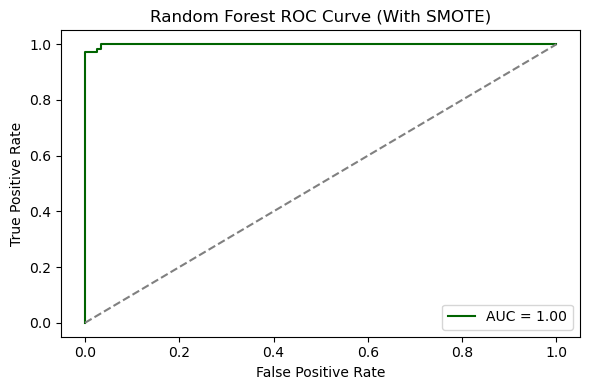

In [190]:
#Splitting the resampled data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_resampled, y_resampled, test_size=0.20, random_state=42)

#Training the Random Forest model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_rf, y_train_rf)

#Making predictions
y_pred_rf = rf_model.predict(X_test_rf)
y_pred_proba_rf = rf_model.predict_proba(X_test_rf)[:, 1]

#Evaluating the model
print(f"Accuracy: {accuracy_score(y_test_rf, y_pred_rf):.4f}")
print(f"Precision: {precision_score(y_test_rf, y_pred_rf):.4f}")
print(f"Recall: {recall_score(y_test_rf, y_pred_rf):.4f}")
print(f"F1 Score: {f1_score(y_test_rf, y_pred_rf):.4f}")
print(f"ROC AUC: {roc_auc_score(y_test_rf, y_pred_proba_rf):.4f}")
print("\nClassification Report:\n", classification_report(y_test_rf, y_pred_rf, digits=4))

#Plotting confusion matrix
conf_matrix_rf = confusion_matrix(y_test_rf, y_pred_rf)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Greens',
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title("Random Forest Confusion Matrix (With SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

#Plotting  ROC curve
from sklearn.metrics import roc_curve
fpr, tpr, _ = roc_curve(y_test_rf, y_pred_proba_rf)

plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test_rf, y_pred_proba_rf):.2f}", color='darkgreen')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("Random Forest ROC Curve (With SMOTE)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# LOGISTIC REGRESSION

Accuracy: 0.965
Recall: 0.9744
Precision: 0.9661
F1 Score: 0.9702

🔍 Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96        83
           1       0.97      0.97      0.97       117

    accuracy                           0.96       200
   macro avg       0.96      0.96      0.96       200
weighted avg       0.96      0.96      0.96       200



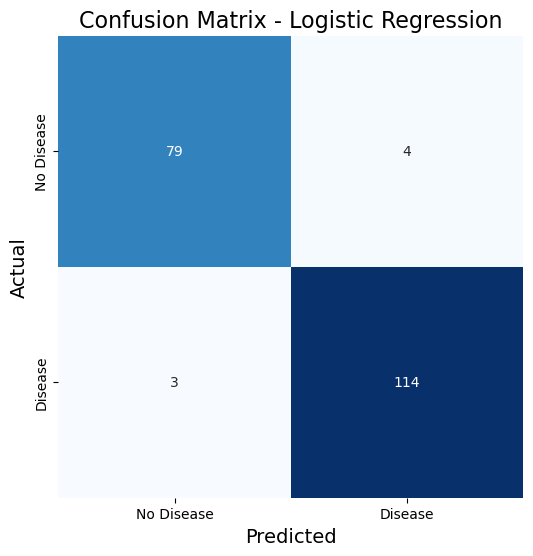

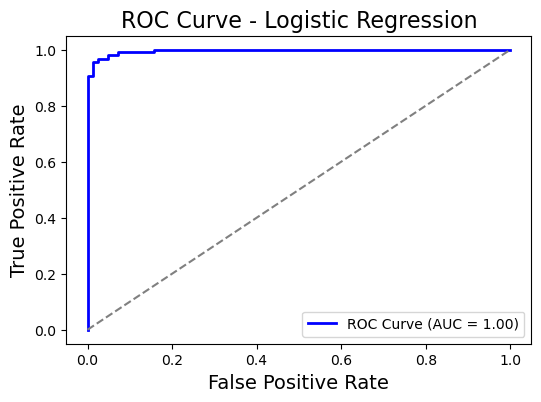

In [112]:
# Separating features (X) and target (y)
X = Cardiovascular.drop('target', axis=1)
y = Cardiovascular['target']

# Scaling the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Splitting the data
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

# Training Logistic Regression
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train_scaled, y_train)

# Making predictions
y_pred = log_reg.predict(X_test_scaled)

# Calculating the metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print metrics
print("Accuracy:", round(accuracy, 4))
print("Recall:", round(recall, 4))
print("Precision:", round(precision, 4))
print("F1 Score:", round(f1, 4))

# Classification Report
print("\n🔍 Classification Report:")
print(classification_report(y_test, y_pred))

#Plotting Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix - Logistic Regression', fontsize=16)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)
plt.show()

# ROC Curve and AUC
y_pred_proba = log_reg.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

#Plotting the ROC Curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curve - Logistic Regression', fontsize=16)
plt.legend(loc='lower right')
plt.show()


In [114]:
#Creating a pipeline with StandardScaler and applying Logistic Regression for classification
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('log_reg', LogisticRegression(max_iter=500))
])

#Defining the hyperparameter distribution
param_dist = {
    'log_reg__C': loguniform(0.001, 10),  # Random values in range
    'log_reg__penalty': ['l1', 'l2'],
    'log_reg__solver': ['liblinear', 'lbfgs'],
    'log_reg__class_weight': ['balanced', None]
}

#Initializing RandomizedSearchCV
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, 
                                   n_iter=20, cv=5, scoring='accuracy', 
                                   n_jobs=-1, verbose=2, random_state=42)

#Fit on training data
random_search.fit(X_train_scaled, y_train)

#Printing the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Cross-Validation Accuracy:", random_search.best_score_)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'log_reg__C': 0.4467752817973907, 'log_reg__class_weight': None, 'log_reg__penalty': 'l2', 'log_reg__solver': 'lbfgs'}
Best Cross-Validation Accuracy: 0.9650000000000001


C:\Users\opeye\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
15 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\opeye\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\opeye\anaconda3\Lib\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\opeye\anaconda3\Lib\site-packages\sklearn\pipeline.py", line 475, in fit
    self._final_estimator.fi

# LIME EXPLANATION

In [120]:


#Import and initialize a Logistic Regression model with a fixed random state for reproducibility
log_reg = LogisticRegression(random_state=42)

#the logistic regression model (fit)  on the scaled training data
log_reg.fit(X_train_scaled, y_train)

#Initializing the LIME explainer for tabular data
# including original feature names and class labels for interpretability
#Set to classification mode
explainer_logreg = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),   # original column names from unscaled data
    class_names=['No Disease', 'Disease'],
    mode='classification'
)

#Selecting an instance from the scaled test set to explain 
i = 10  
instance = X_test_scaled[i] 

#Generating a LIME explanation for the selected instance

# - num_features: number of top features to include in the explanation
exp_logreg = explainer_logreg.explain_instance(
    data_row=instance,
    predict_fn=log_reg.predict_proba, # - predict_fn: function to return class probabilities
    num_features=len(X.columns)  # Showing contributions of all features
)

#Displaying the explanation
exp_logreg.show_in_notebook(show_table=True)


# REMOVING THE LEAST VARIABLES

 Accuracy: 0.964
 Recall: 0.9565
 F1 Score: 0.967
Precision: 0.9778

🧾 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       112
           1       0.98      0.96      0.97       138

    accuracy                           0.96       250
   macro avg       0.96      0.96      0.96       250
weighted avg       0.96      0.96      0.96       250



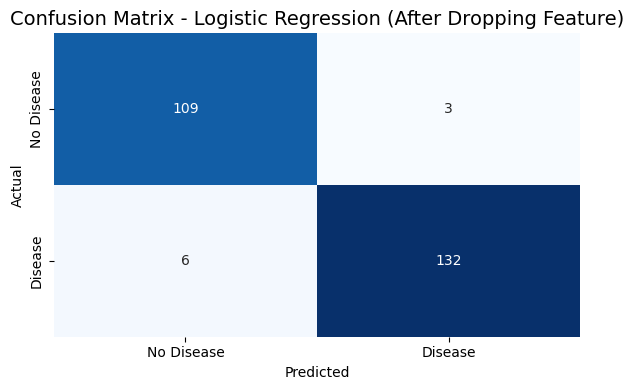

In [121]:
#Re-splitting the updated dataset (after dropping a feature)
X_drop_train, X_drop_test, y_drop_train, y_drop_test = train_test_split(
    X_drop, y, test_size=0.25, random_state=42
)

#Feature Scaling
scaler = StandardScaler()
X_drop_train_scaled = scaler.fit_transform(X_drop_train)
X_drop_test_scaled = scaler.transform(X_drop_test)

#Training Logistic Regression
log_reg = LogisticRegression(random_state=42, class_weight='balanced')
log_reg.fit(X_drop_train_scaled, y_drop_train)

#Making predictions
y_pred = log_reg.predict(X_drop_test_scaled)

#Evaluating metrics
accuracy = accuracy_score(y_drop_test, y_pred)
recall = recall_score(y_drop_test, y_pred)
f1 = f1_score(y_drop_test, y_pred)
precision = precision_score(y_drop_test, y_pred)

print(" Accuracy:", round(accuracy, 4))
print(" Recall:", round(recall, 4))
print(" F1 Score:", round(f1, 4))
print("Precision:", round(precision,4))

# Detailed Report
print("\n🧾 Classification Report:")
print(classification_report(y_drop_test, y_pred))

#Computing confusion Matrix
conf_matrix = confusion_matrix(y_drop_test, y_pred)
#Plotting Confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix - Logistic Regression (After Dropping Feature)', fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

# BALANCING DATASET FOR LOGISTIC REGRESSION

Accuracy: 0.9655
Precision: 0.9646
Recall: 0.9646
F1 Score: 0.9646
ROC AUC: 0.9969

Classification Report:
               precision    recall  f1-score   support

           0     0.9664    0.9664    0.9664       119
           1     0.9646    0.9646    0.9646       113

    accuracy                         0.9655       232
   macro avg     0.9655    0.9655    0.9655       232
weighted avg     0.9655    0.9655    0.9655       232



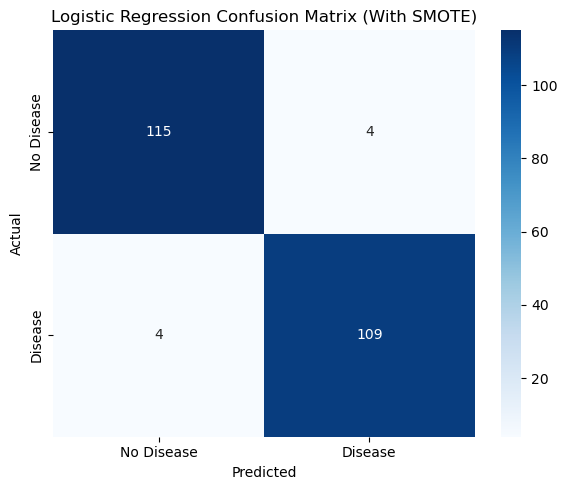

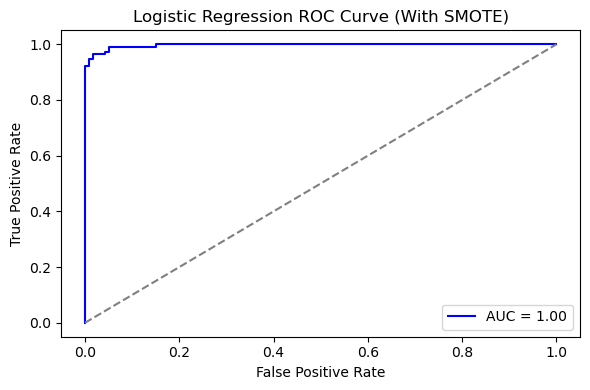

In [192]:
#Training and testing splitting the resampled dataset
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_resampled, y_resampled, test_size=0.20, random_state=42)

#Scaling the features
scaler = StandardScaler()
X_train_scaled_lr = scaler.fit_transform(X_train_lr)
X_test_scaled_lr = scaler.transform(X_test_lr)

#Training Logistic Regression
logreg = LogisticRegression(max_iter=500, random_state=42)
logreg.fit(X_train_scaled_lr, y_train_lr)

#Making Predictions
y_pred_lr = logreg.predict(X_test_scaled_lr)
y_pred_proba_lr = logreg.predict_proba(X_test_scaled_lr)[:, 1]

#Evaluating the performance
print(f"Accuracy: {accuracy_score(y_test_lr, y_pred_lr):.4f}")
print(f"Precision: {precision_score(y_test_lr, y_pred_lr):.4f}")
print(f"Recall: {recall_score(y_test_lr, y_pred_lr):.4f}")
print(f"F1 Score: {f1_score(y_test_lr, y_pred_lr):.4f}")
print(f"ROC AUC: {roc_auc_score(y_test_lr, y_pred_proba_lr):.4f}")
print("\nClassification Report:\n", classification_report(y_test_lr, y_pred_lr, digits=4))

#plotting the Confusion matrix
conf_matrix_lr = confusion_matrix(y_test_lr, y_pred_lr)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_lr, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title("Logistic Regression Confusion Matrix (With SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# plotting the ROC Curve
fpr, tpr, _ = roc_curve(y_test_lr, y_pred_proba_lr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test_lr, y_pred_proba_lr):.2f}", color='blue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("Logistic Regression ROC Curve (With SMOTE)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# XGBOOST

Accuracy: 0.97
Recall: 0.9829
Precision: 0.9664
F1 Score: 0.9746
ROC AUC: 0.9973

🧾 Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96        83
           1       0.97      0.98      0.97       117

    accuracy                           0.97       200
   macro avg       0.97      0.97      0.97       200
weighted avg       0.97      0.97      0.97       200



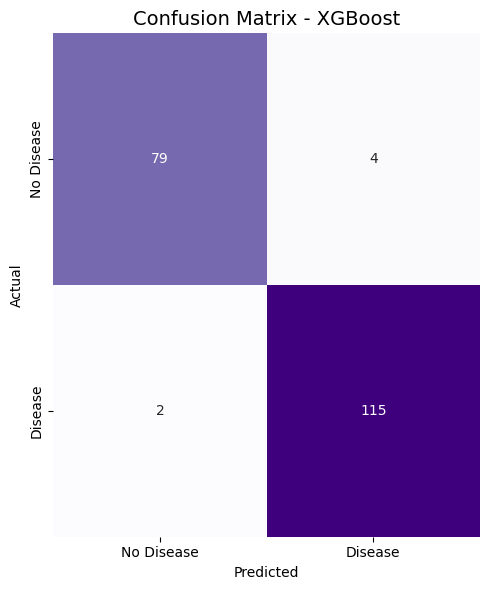

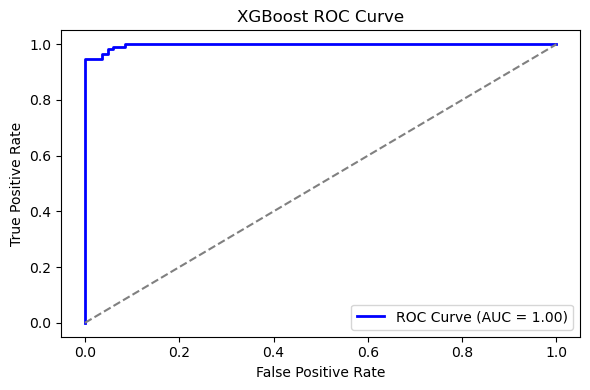

In [134]:
#Training the XGBoost model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

#Making predictions
y_pred_xgb = xgb_model.predict(X_test)
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]  # For ROC

#Evaluating the performance
accuracy = accuracy_score(y_test, y_pred_xgb)
recall = recall_score(y_test, y_pred_xgb)
precision = precision_score(y_test, y_pred_xgb)
f1 = f1_score(y_test, y_pred_xgb)
roc_auc = roc_auc_score(y_test, y_proba_xgb)

#Printing Metrics
print("Accuracy:", round(accuracy, 4))
print("Recall:", round(recall, 4))
print("Precision:", round(precision, 4))
print("F1 Score:", round(f1, 4))
print("ROC AUC:", round(roc_auc, 4))

#Classification Report
print("\n🧾 Classification Report:")
print(classification_report(y_test, y_pred_xgb))

#Computing the Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)

#Plotting the confusion matrix
plt.figure(figsize=(5, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Purples', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix - XGBoost', fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba_xgb)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost ROC Curve')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


In [136]:
# Defining parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1]
}

# Define XGBoost model
xgb_model = xgb.XGBClassifier(objective="binary:logistic", eval_metric="logloss", use_label_encoder=False)

# Perform Grid Search with Cross-Validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, 
                           scoring='accuracy', cv=5, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X_train, y_train)

# Printing the best parameters
print("Best Parameters:", grid_search.best_params_)
print("Best CV Accuracy After Tuning:", grid_search.best_score_)




Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8}
Best CV Accuracy After Tuning: 0.9737499999999999


# LIME EXPLANATION

In [138]:
#Initializing an XGBoost Classifier
xgb_model = xgb.XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

#Fitting the model on the training dataset
xgb_model.fit(X_train, y_train)

#Creating a LIME explainer for tabular data
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X.columns.tolist(),
    class_names=['No Disease', 'Disease'],
    mode='classification'
)

#Selecting a specific test instance (10th row) for explanation
i = 10
instance = X_test.iloc[i]

#Generating LIME explanation for the selected instance
exp_xgb = explainer_xgb.explain_instance(
    data_row=instance,
    predict_fn=xgb_model.predict_proba,
    num_features=len(X.columns) #number of top contributing features to include

)

#Displaying the explanation inline
exp_xgb.show_in_notebook(show_table=True) #Includes a visual chart and a table of feature contributions



# REMOVING LEAST FEATURES

Accuracy: 0.97
Recall: 0.9829
F1 Score: 0.9746
Precision: 0.9664
ROC AUC: 0.9975
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96        83
           1       0.97      0.98      0.97       117

    accuracy                           0.97       200
   macro avg       0.97      0.97      0.97       200
weighted avg       0.97      0.97      0.97       200



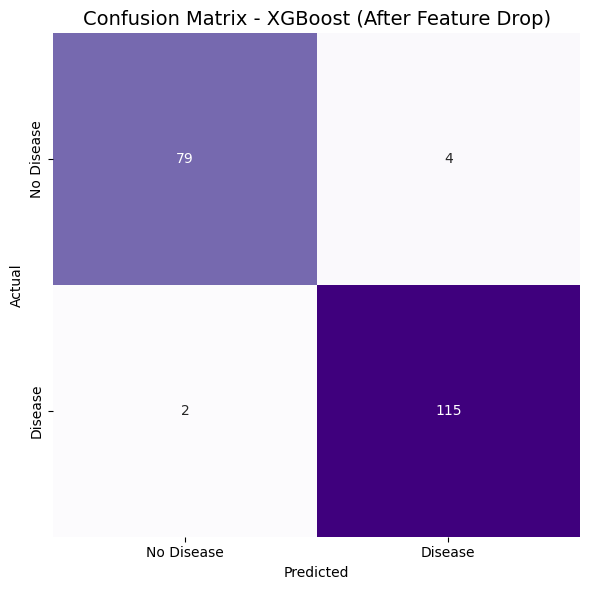

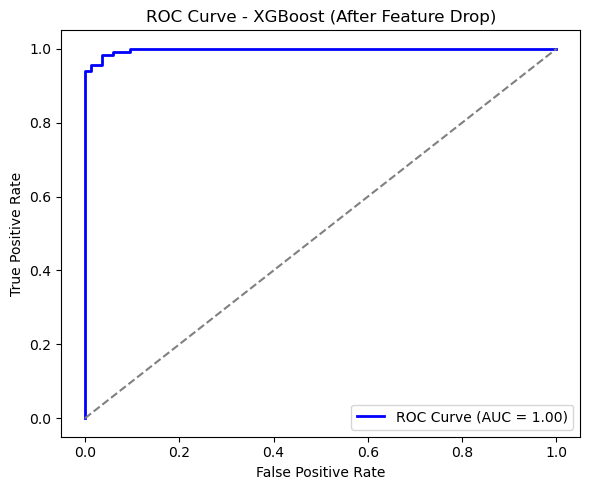

In [165]:
#Splitting the dataset after dropping less important features
X_drop_train, X_drop_test, y_drop_train, y_drop_test = train_test_split(
    X_drop, y, test_size=0.20, random_state=42
)

#Initializing and training the XGBoost classifier
xgb_model = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_drop_train, y_drop_train)

#Making predictions on the test set
y_pred = xgb_model.predict(X_drop_test) #predicted classes
y_pred_proba = xgb_model.predict_proba(X_drop_test)[:, 1]#predicted probabilities for the positive class


#Evaluating classification performance using multiple metrics
accuracy = accuracy_score(y_drop_test, y_pred)
recall = recall_score(y_drop_test, y_pred)
precision = precision_score(y_drop_test, y_pred)
f1 = f1_score(y_drop_test, y_pred)
roc_auc = roc_auc_score(y_drop_test, y_pred_proba)

#Prining the evaluation metrics
#Rounded to 4 decimal places for clarity
print("Accuracy:", round(accuracy, 4))
print("Recall:", round(recall, 4))
print("F1 Score:", round(f1, 4))
print("Precision:", round(precision, 4))
print("ROC AUC:", round(roc_auc, 4))

#Detailed classification report including per-class precision, recall, and f1
print("Classification Report:")
print(classification_report(y_drop_test, y_pred))

# Plot confusion matrix to visualize true vs. predicted classes
conf_matrix = confusion_matrix(y_drop_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Purples', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix - XGBoost (After Feature Drop)', fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

#Plot the ROC curve to assess model's discriminative ability
#Shows trade-off between true positive rate and false positive rate
#Including AUC score in the legend
fpr, tpr, thresholds = roc_curve(y_drop_test, y_pred_proba)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal baseline
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost (After Feature Drop)')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# BALANCING DATASET XGB

Accuracy: 0.9483
Precision: 0.9469
Recall: 0.9469
F1 Score: 0.9469
ROC AUC: 0.9965

Classification Report:
               precision    recall  f1-score   support

           0     0.9496    0.9496    0.9496       119
           1     0.9469    0.9469    0.9469       113

    accuracy                         0.9483       232
   macro avg     0.9482    0.9482    0.9482       232
weighted avg     0.9483    0.9483    0.9483       232



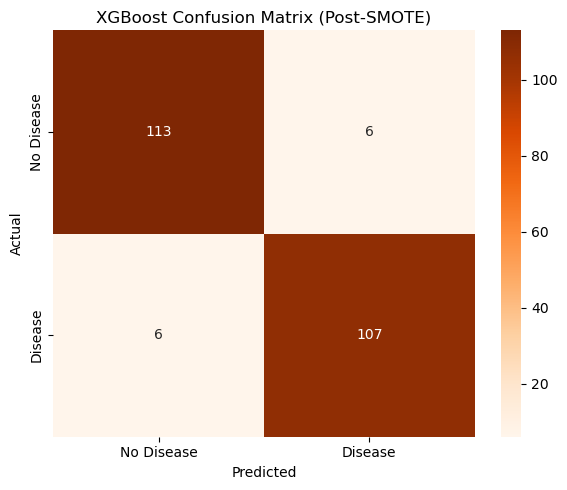

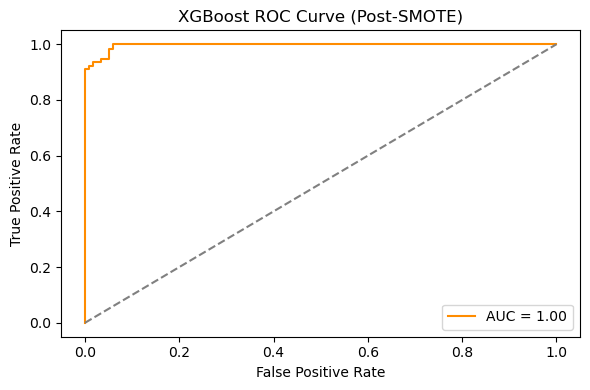

In [198]:
#Splitting the SMOTE-balanced dataset
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(X_resampled, y_resampled, test_size=0.20, random_state=42)

#training the XGBoost classifier
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train_xgb, y_train_xgb)

#Making predictions
y_pred_xgb = xgb_model.predict(X_test_xgb)
y_pred_proba_xgb = xgb_model.predict_proba(X_test_xgb)[:, 1]

#Evaluating the model performance
print(f"Accuracy: {accuracy_score(y_test_xgb, y_pred_xgb):.4f}")
print(f"Precision: {precision_score(y_test_xgb, y_pred_xgb):.4f}")
print(f"Recall: {recall_score(y_test_xgb, y_pred_xgb):.4f}")
print(f"F1 Score: {f1_score(y_test_xgb, y_pred_xgb):.4f}")
print(f"ROC AUC: {roc_auc_score(y_test_xgb, y_pred_proba_xgb):.4f}")
print("\nClassification Report:\n", classification_report(y_test_xgb, y_pred_xgb, digits=4))

#plotting Confusion Matrix
conf_matrix_xgb = confusion_matrix(y_test_xgb, y_pred_xgb)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='Oranges',
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title("XGBoost Confusion Matrix (Post-SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

#plotting the ROC Curve
fpr, tpr, _ = roc_curve(y_test_xgb, y_pred_proba_xgb)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test_xgb, y_pred_proba_xgb):.2f}", color='darkorange')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("XGBoost ROC Curve (Post-SMOTE)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# NAIVES BAYES

In [142]:
#Training Naïve Bayes with scaled data
nb_scaled = GaussianNB()
nb_scaled.fit(X_train_scaled, y_train)

# Making predictions
y_pred_nb_scaled = nb_scaled.predict(X_test_scaled)

# Printing performance
print( accuracy_score(y_test, y_pred_nb_scaled))
print("\nNaïve Bayes Classification Report:\n", classification_report(y_test, y_pred_nb_scaled))

# Calculating performance and display metrics (scaled to percentage)

accuracy = accuracy_score(y_test, y_pred_nb_scaled) * 100
f1 = f1_score(y_test, y_pred_nb_scaled) * 100
recall = recall_score(y_test, y_pred_nb_scaled) * 100
precision = precision_score(y_test, y_pred_nb_scaled) * 100

#Printing  evaluation metrics #Rounded to two decimal places for readabil
print(" Accuracy = {:.2f}%".format(accuracy))
print(" F1 Score = {:.2f}%".format(f1))
print(" Recall = {:.2f}%".format(recall))
print(" Precision = {:.2f}%".format(precision))


0.975

Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.96      0.97        83
           1       0.97      0.98      0.98       117

    accuracy                           0.97       200
   macro avg       0.98      0.97      0.97       200
weighted avg       0.98      0.97      0.97       200

 Accuracy = 97.50%
 F1 Score = 97.87%
 Recall = 98.29%
 Precision = 97.46%


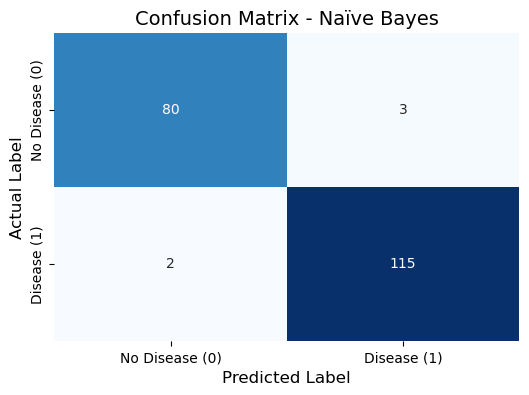

In [143]:
# Compute confusion matrix
conf_matrix_nb = confusion_matrix(y_test, y_pred_nb_scaled)

# Plotting confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_nb, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Disease (0)', 'Disease (1)'],
            yticklabels=['No Disease (0)', 'Disease (1)'])

# Titles and labels
plt.title('Confusion Matrix - Naïve Bayes', fontsize=14)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('Actual Label', fontsize=12)
plt.show()


In [144]:
# Defining parameter grid for tuning
param_grid = {'var_smoothing': np.logspace(-9, 0, 10)}

# Perform Grid Search with Cross-Validation
grid_search_nb = GridSearchCV(GaussianNB(), param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)
grid_search_nb.fit(X_scaled, y)

# Printing best hyperparameters
print("Best Parameters:", grid_search_nb.best_params_)
print("Best Cross-Validation Accuracy:", grid_search_nb.best_score_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'var_smoothing': 1e-09}
Best Cross-Validation Accuracy: 0.946


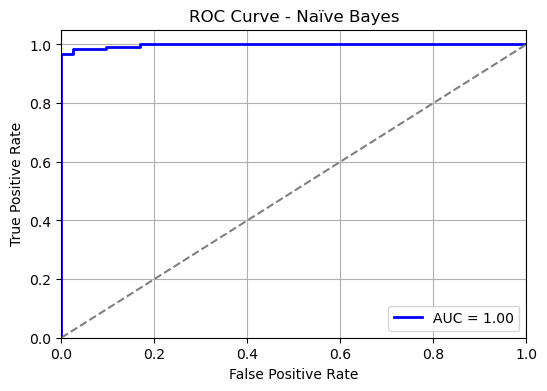

In [146]:
# Initializing the trained Naïve Bayes model
nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train) 

# Get predicted probabilities for the positive class
y_pred_proba_nb = nb_model.predict_proba(X_test_scaled)[:, 1]  # Probabilities for class 1

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_nb)

# Compute AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba_nb)

# Plot the ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guessing line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Naïve Bayes')
plt.legend(loc="lower right")
plt.grid()
plt.show()


# LIME EXPLANATION

In [147]:
#Initializing the Naïve Bayes model
nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train)

# 2. Initialize LIME explainer
explainer_nb = LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),     # column names before scaling
    class_names=['No Disease', 'Disease'],
    mode='classification'
)

#Pick a sample to explain
i = 10
instance = X_test_scaled[i]

#Running the explanation
exp_nb = explainer_nb.explain_instance(
    data_row=instance,
    predict_fn=nb_model.predict_proba,
    num_features=len(X.columns)  # or just 10
)

#Showing the explanation
exp_nb.show_in_notebook(show_table=True)



# REMOVING LEAST FEATURES

Accuracy: 0.96
Recall: 0.971
Precision: 0.9571
F1 Score: 0.964
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       112
           1       0.96      0.97      0.96       138

    accuracy                           0.96       250
   macro avg       0.96      0.96      0.96       250
weighted avg       0.96      0.96      0.96       250



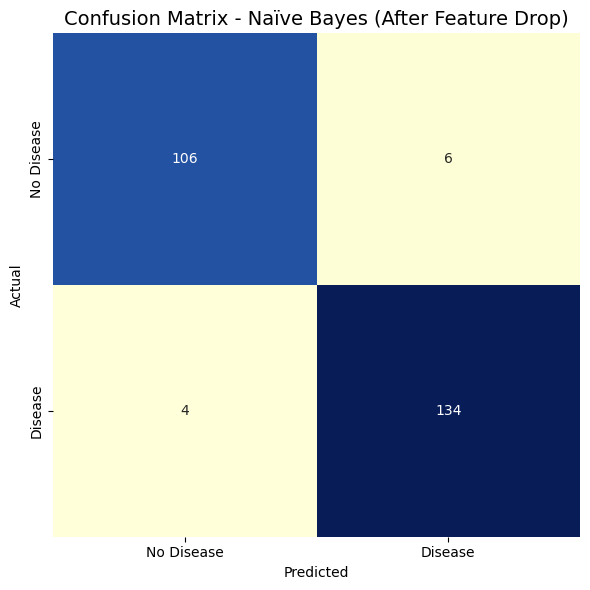

In [149]:

# Split the dataset after feature removal (X_drop) into training and testing sets
X_drop_train, X_drop_test, y_drop_train, y_drop_test = train_test_split(X_drop, y, test_size=0.25, random_state=42)

#Scaling the features
scaler = StandardScaler()
X_train_scaled_drop = scaler.fit_transform(X_drop_train)
X_test_scaled_drop = scaler.transform(X_drop_test)

#Training Naïve Bayes model
nb = GaussianNB()
nb.fit(X_train_scaled_drop, y_drop_train)
y_pred_nb = nb.predict(X_test_scaled_drop)

#Performance Evaluation
accuracy = accuracy_score(y_drop_test, y_pred_nb)
recall = recall_score(y_drop_test, y_pred_nb)
precision = precision_score(y_drop_test, y_pred_nb)
f1 = f1_score(y_drop_test, y_pred_nb)

#Print metrics
print("Accuracy:", round(accuracy, 4))
print("Recall:", round(recall, 4))
print("Precision:", round(precision, 4))
print("F1 Score:", round(f1, 4))

print("Classification Report:")
print(classification_report(y_drop_test, y_pred_nb))

#Confusion Matrix
conf_matrix = confusion_matrix(y_drop_test, y_pred_nb)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='YlGnBu', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix - Naïve Bayes (After Feature Drop)', fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()


# BALANCING DATASET FOR NB

Accuracy: 0.9741
Precision: 0.9735
Recall: 0.9735
F1 Score: 0.9735
ROC AUC: 0.9973

Classification Report:
               precision    recall  f1-score   support

           0     0.9748    0.9748    0.9748       119
           1     0.9735    0.9735    0.9735       113

    accuracy                         0.9741       232
   macro avg     0.9741    0.9741    0.9741       232
weighted avg     0.9741    0.9741    0.9741       232



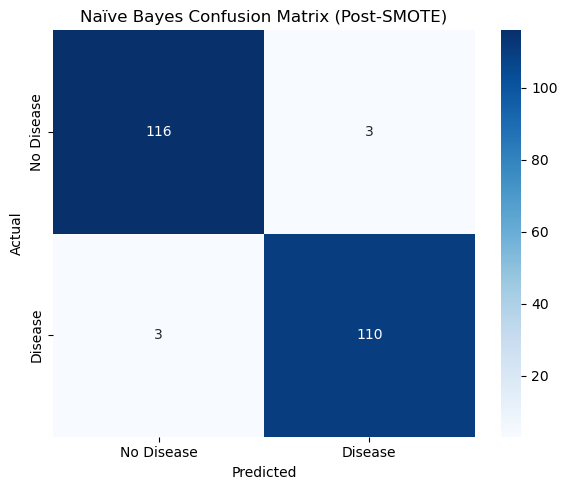

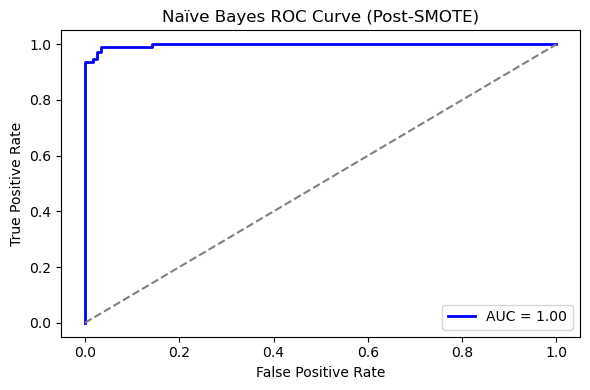

In [199]:
# Step 1: Split the SMOTE-balanced dataset (80% train, 20% test)
X_train_nb, X_test_nb, y_train_nb, y_test_nb = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 2: Scale the data (important for GaussianNB)
scaler = StandardScaler()
X_train_nb_scaled = scaler.fit_transform(X_train_nb)
X_test_nb_scaled = scaler.transform(X_test_nb)

# Step 3: Train Gaussian Naïve Bayes
nb_model = GaussianNB()
nb_model.fit(X_train_nb_scaled, y_train_nb)

# Step 4: Make predictions
y_pred_nb = nb_model.predict(X_test_nb_scaled)
y_pred_proba_nb = nb_model.predict_proba(X_test_nb_scaled)[:, 1]

# Step 5: Evaluate the model
print(f"Accuracy: {accuracy_score(y_test_nb, y_pred_nb):.4f}")
print(f"Precision: {precision_score(y_test_nb, y_pred_nb):.4f}")
print(f"Recall: {recall_score(y_test_nb, y_pred_nb):.4f}")
print(f"F1 Score: {f1_score(y_test_nb, y_pred_nb):.4f}")
print(f"ROC AUC: {roc_auc_score(y_test_nb, y_pred_proba_nb):.4f}")
print("\nClassification Report:\n", classification_report(y_test_nb, y_pred_nb, digits=4))

# Step 6: Confusion matrix
conf_matrix_nb = confusion_matrix(y_test_nb, y_pred_nb)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_nb, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title("Naïve Bayes Confusion Matrix (Post-SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# Step 7: ROC Curve
fpr, tpr, _ = roc_curve(y_test_nb, y_pred_proba_nb)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"AUC = {roc_auc_score(y_test_nb, y_pred_proba_nb):.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("Naïve Bayes ROC Curve (Post-SMOTE)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# SVM

Accuracy: 0.9850

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98        83
           1       0.98      0.99      0.99       117

    accuracy                           0.98       200
   macro avg       0.99      0.98      0.98       200
weighted avg       0.99      0.98      0.98       200



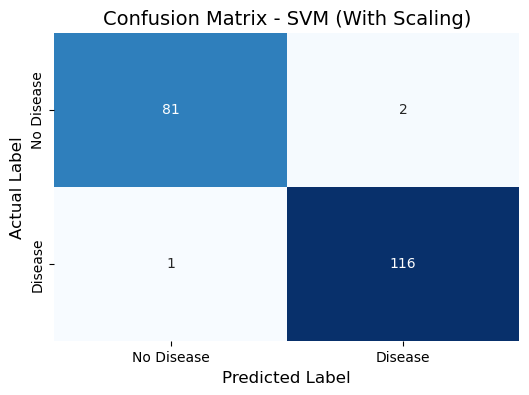


Model Performance:
Accuracy: 0.9850
Precision: 0.9831
Recall: 0.9915
F1-Score: 0.9872


In [154]:
# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train SVM model (with scaling)
svm_model_scaled = SVC(kernel='rbf', probability=True, random_state=42)
svm_model_scaled.fit(X_train_scaled, y_train)

# Make predictions
y_pred_svm_scaled = svm_model_scaled.predict(X_test_scaled)

# Evaluate performance
print(f"Accuracy: {accuracy_score(y_test, y_pred_svm_scaled):.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred_svm_scaled))

# Plot confusion matrix
conf_matrix_svm_scaled = confusion_matrix(y_test, y_pred_svm_scaled)

plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_svm_scaled, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])

plt.title('Confusion Matrix - SVM (With Scaling)', fontsize=14)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('Actual Label', fontsize=12)
plt.show()
accuracy = accuracy_score(y_test, y_pred_svm_scaled)
precision = precision_score(y_test, y_pred_svm_scaled)
recall = recall_score(y_test, y_pred_svm_scaled)
f1 = f1_score(y_test, y_pred_svm_scaled)

print("\nModel Performance:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")


In [155]:
# Define parameter grid for tuning
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'gamma': ['scale', 'auto', 0.01, 0.1, 1],  # Kernel coefficient
    'kernel': ['linear', 'rbf', 'poly']  # Kernel type
}

# Initialize GridSearchCV
grid_search_svm = GridSearchCV(SVC(probability=True, random_state=42), param_grid, 
                               cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fitting the model
grid_search_svm.fit(X_train_scaled, y_train)

# Print best hyperparameters
print("Best Parameters:", grid_search_svm.best_params_)
print("Best Cross-Validation Accuracy:", grid_search_svm.best_score_)

# Use the best model
best_svm_model = grid_search_svm.best_estimator_

# Make predictions on the test set
y_pred_best_svm = best_svm_model.predict(X_test_scaled)

from sklearn.metrics import accuracy_score, classification_report
print("\nFinal SVM Accuracy (After Tuning & Scaling):", accuracy_score(y_test, y_pred_best_svm))
print("\nFinal Classification Report:\n", classification_report(y_test, y_pred_best_svm))



Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best Parameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Best Cross-Validation Accuracy: 0.9650000000000001

Final SVM Accuracy (After Tuning & Scaling): 0.97

Final Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96        83
           1       0.98      0.97      0.97       117

    accuracy                           0.97       200
   macro avg       0.97      0.97      0.97       200
weighted avg       0.97      0.97      0.97       200



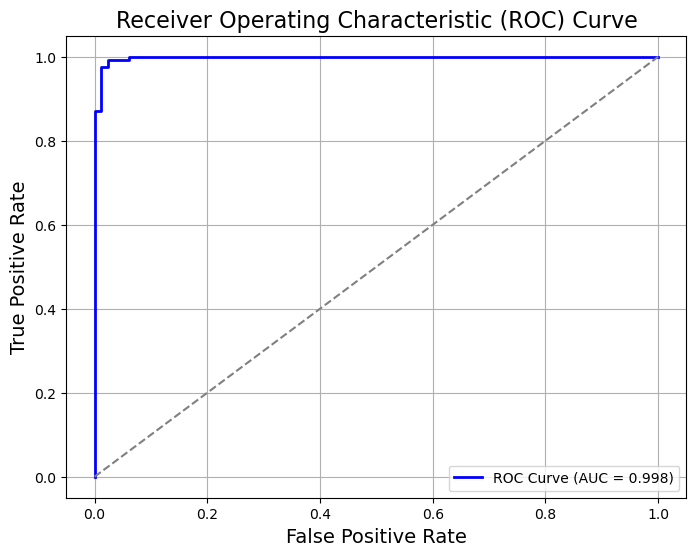

In [156]:
# Get predicted probabilities for the positive class
y_pred_proba = svm_model_scaled.predict_proba(X_test_scaled)[:, 1]

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Compute AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random classifier line
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.legend(loc='lower right')
plt.grid()
plt.show()


# LIME EXPLANATION

In [158]:
#Initializing the Trained the SVM model
svm_model = SVC(
    kernel='rbf',
    probability=True,             
    class_weight='balanced',     
    random_state=42
)
svm_model.fit(X_train_scaled, y_train)


#Creating the LIME explainer for scaled features
explainer_svm = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),     # use your original column names
    class_names=['No Disease', 'Disease'],
    mode='classification'
)

#Picking a test instance to explain
i = 10 
instance = X_test_scaled[i]

#Running the LIME explanation
exp_svm = explainer_svm.explain_instance(
    data_row=instance,
    predict_fn=svm_model.predict_proba,
    num_features=len(X.columns)
)

#Visualizing the explanation
exp_svm.show_in_notebook(show_table=True)



# REMOVING LEAST FEATURES

Accuracy: 0.9850
Recall: 0.9829
F1 Score: 0.9871
Precision: 0.9914

Classification Report:
              precision    recall  f1-score   support

           0     0.9762    0.9880    0.9820        83
           1     0.9914    0.9829    0.9871       117

    accuracy                         0.9850       200
   macro avg     0.9838    0.9854    0.9846       200
weighted avg     0.9851    0.9850    0.9850       200



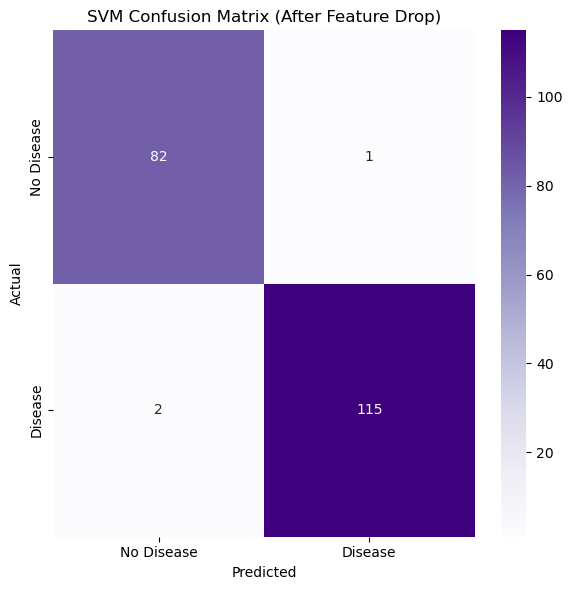

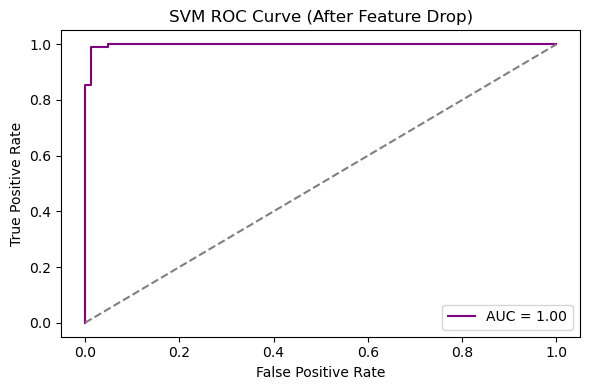

In [164]:
#Splitting the X_drop into train/test
X_drop_train, X_drop_test, y_drop_train, y_drop_test = train_test_split(
    X_drop, y, test_size=0.20, random_state=42
)

#Scaling the dropped-feature data
scaler = StandardScaler()
X_train_scaled_drop = scaler.fit_transform(X_drop_train)
X_test_scaled_drop = scaler.transform(X_drop_test)

#Training the SVM model
svm_model = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=42)
svm_model.fit(X_train_scaled_drop, y_drop_train)

#Predicting
y_pred_svm = svm_model.predict(X_test_scaled_drop)


# Calculating metrics
accuracy = accuracy_score(y_drop_test, y_pred_svm)
recall = recall_score(y_drop_test, y_pred_svm)
f1 = f1_score(y_drop_test, y_pred_svm)
precision = precision_score(y_drop_test, y_pred_svm)

# Print metrics with 4 decimal places
print(f"Accuracy: {accuracy:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")

# Print classification report with 4 decimal precision
print("\nClassification Report:")
print(classification_report(y_drop_test, y_pred_svm, digits=4))


#Plotting Confusion Matrix
conf_matrix_svm = confusion_matrix(y_drop_test, y_pred_svm)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix_svm, annot=True, fmt='d', cmap='Purples',
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title("SVM Confusion Matrix (After Feature Drop)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

#Plotting the ROC Curve
y_pred_proba_svm = svm_model.predict_proba(X_test_scaled_drop)[:, 1]
fpr, tpr, _ = roc_curve(y_drop_test, y_pred_proba_svm)
roc_auc = roc_auc_score(y_drop_test, y_pred_proba_svm)

plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='purple', label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("SVM ROC Curve (After Feature Drop)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# BALANCING DATASET FOR SVM

Accuracy: 0.9741
Precision: 0.9652
Recall: 0.9823
F1 Score: 0.9737
ROC AUC: 0.9978

Classification Report:
               precision    recall  f1-score   support

           0     0.9829    0.9664    0.9746       119
           1     0.9652    0.9823    0.9737       113

    accuracy                         0.9741       232
   macro avg     0.9741    0.9743    0.9741       232
weighted avg     0.9743    0.9741    0.9741       232



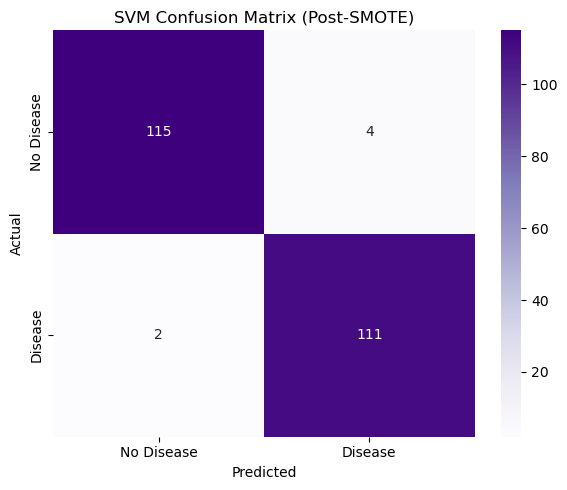

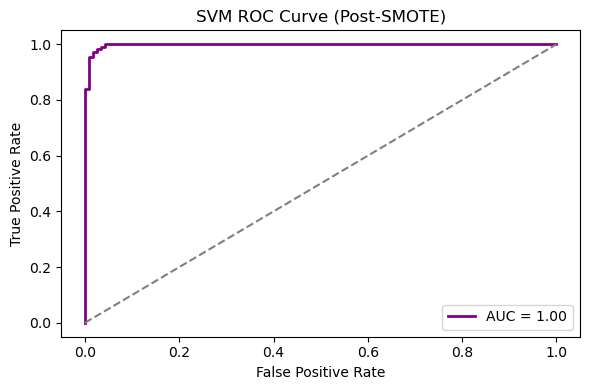

In [200]:
#Split the SMOTE-balanced dataset
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 2: Scale the features (very important for SVM)
scaler = StandardScaler()
X_train_svm_scaled = scaler.fit_transform(X_train_svm)
X_test_svm_scaled = scaler.transform(X_test_svm)

# Step 3: Train the SVM model
svm_model = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=42)
svm_model.fit(X_train_svm_scaled, y_train_svm)

# Step 4: Make predictions
y_pred_svm = svm_model.predict(X_test_svm_scaled)
y_pred_proba_svm = svm_model.predict_proba(X_test_svm_scaled)[:, 1]

# Step 5: Evaluate the model
print(f"Accuracy: {accuracy_score(y_test_svm, y_pred_svm):.4f}")
print(f"Precision: {precision_score(y_test_svm, y_pred_svm):.4f}")
print(f"Recall: {recall_score(y_test_svm, y_pred_svm):.4f}")
print(f"F1 Score: {f1_score(y_test_svm, y_pred_svm):.4f}")
print(f"ROC AUC: {roc_auc_score(y_test_svm, y_pred_proba_svm):.4f}")
print("\nClassification Report:\n", classification_report(y_test_svm, y_pred_svm, digits=4))

# Step 6: Confusion matrix
conf_matrix_svm = confusion_matrix(y_test_svm, y_pred_svm)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_svm, annot=True, fmt='d', cmap='Purples',
            xticklabels=['No Disease', 'Disease'],
            yticklabels=['No Disease', 'Disease'])
plt.title("SVM Confusion Matrix (Post-SMOTE)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# Step 7: ROC Curve
fpr, tpr, _ = roc_curve(y_test_svm, y_pred_proba_svm)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='purple', lw=2, label=f"AUC = {roc_auc_score(y_test_svm, y_pred_proba_svm):.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("SVM ROC Curve (Post-SMOTE)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# MODEL PERFORMANCE COMPARISON

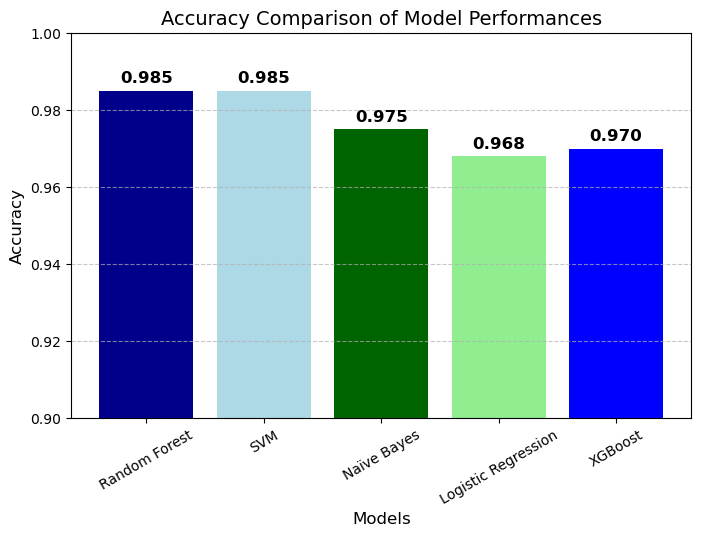

In [179]:
# Define the models and their corresponding accuracy scores (update these with your actual results)
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
accuracy_scores = [0.9850, 0.9850, 0.9750, 0.968, 0.97] 

# Define colors for each model
colors = ['darkblue', 'lightblue', 'darkgreen', 'lightgreen', 'blue']

# Create bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, accuracy_scores, color=colors)

# Add accuracy values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Accuracy Comparison of Model Performances', fontsize=14)
plt.ylim(0.9, 1.0)  # Adjust the y-axis to zoom in on differences
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


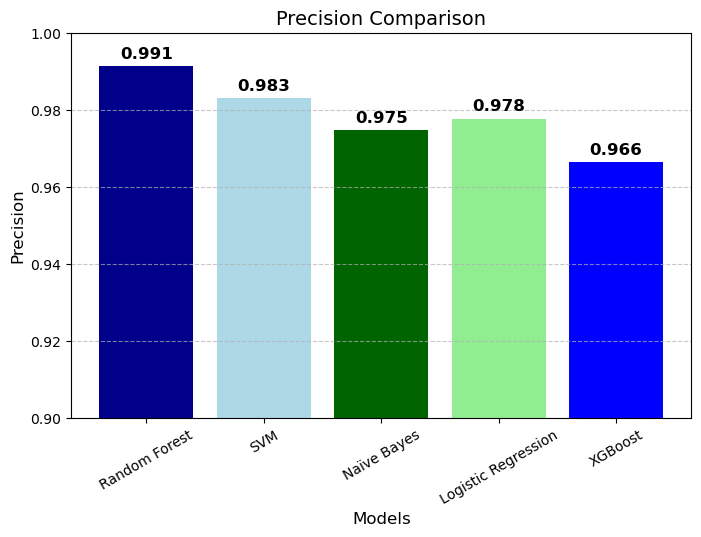

In [178]:
# Define precision scores
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
precision_scores = [0.9914, 0.9831, 0.9748, 0.9778, 0.9664]  # Replace with actual values

# Create bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, precision_scores, color=colors)

# Adding values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Adding Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision Comparison', fontsize=14)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Showing the plot
plt.show()


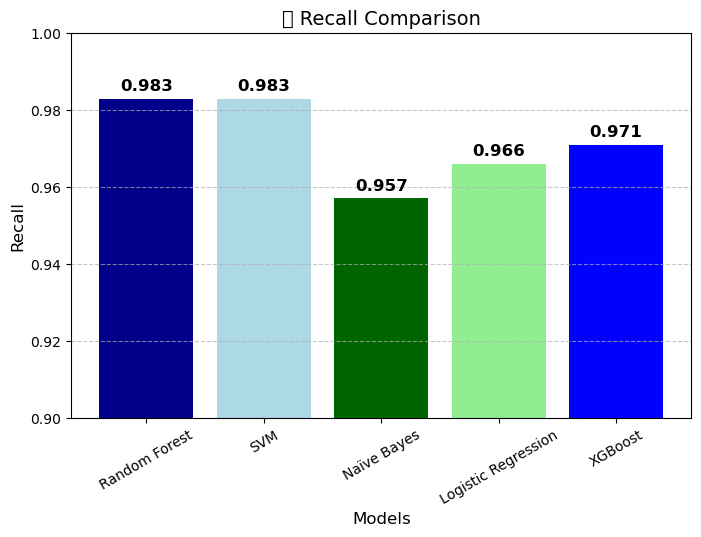

In [174]:
# Define recall scores
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
recall_scores = [0.9829, 0.9829, 0.9571, 0.9661, 0.971]  

# Creating bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, recall_scores, color=colors)

# Adding values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

#Adding Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.title('📊 Recall Comparison', fontsize=14)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


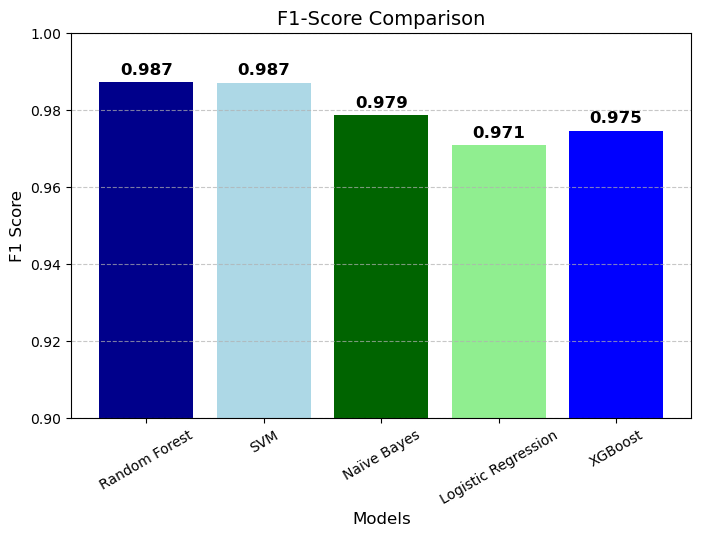

In [177]:
# Define F1-score values
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
f1_scores = [0.9872, 0.9871, 0.9787, 0.9708, 0.9746]  

# Create bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, f1_scores, color=colors)

# Add values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.title('F1-Score Comparison', fontsize=14)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


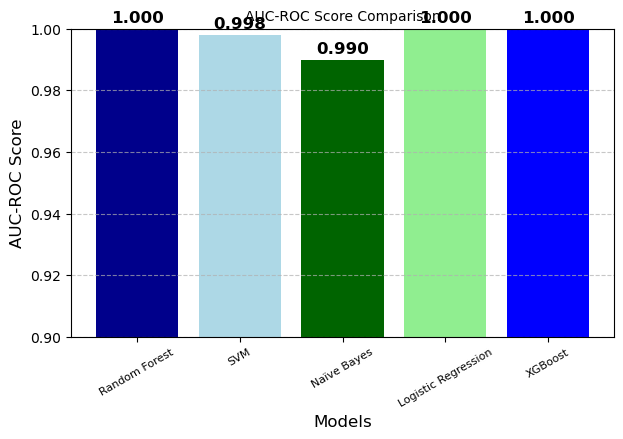

In [185]:
# Define AUC-ROC scores
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
auc_roc_scores = [1.00, 0.998, 0.99, 1.00, 1.00]  

# Create bar plot
plt.figure(figsize=(7, 4))
bars = plt.bar(models, auc_roc_scores, color=colors)

# Add values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('AUC-ROC Score', fontsize=12)
plt.title('AUC-ROC Score Comparison', fontsize=10)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=8)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


# MODEL PERFORMANCE AFTER REMOVING LEAST IMPORTANT FEATURE

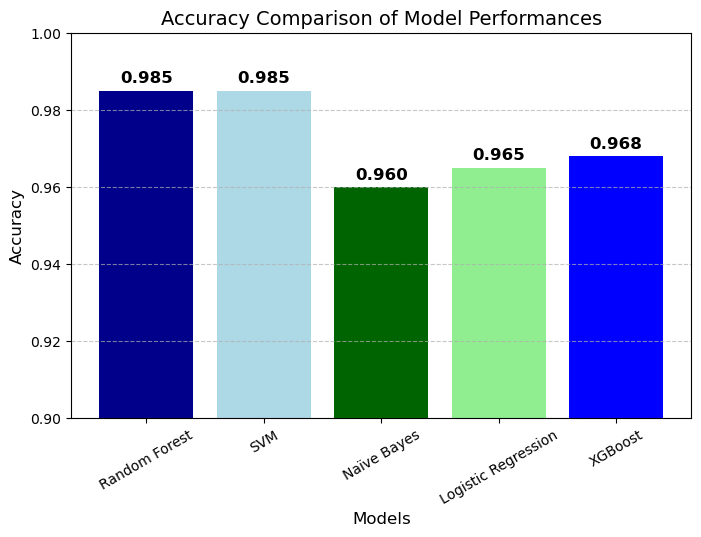

In [180]:
# Define the models and their corresponding accuracy scores
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
accuracy_scores = [0.9850, 0.9850, 0.96, 0.965, 0.968] 

# Defining colors for each model
colors = ['darkblue', 'lightblue', 'darkgreen', 'lightgreen', 'blue']

# Creating bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, accuracy_scores, color=colors)

# Adding accuracy values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Accuracy Comparison of Model Performances', fontsize=14)
plt.ylim(0.9, 1.0)  # Adjust the y-axis to zoom in on differences
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

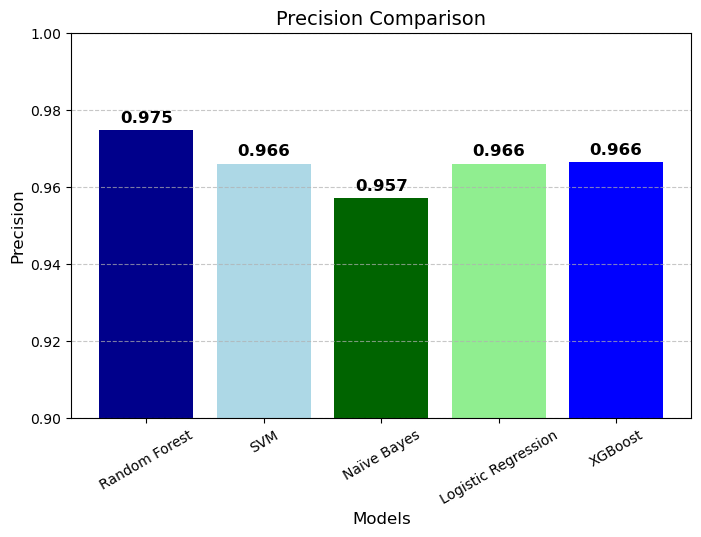

In [182]:
# Define precision scores
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
precision_scores = [0.9748, 0.9661, 0.9571, 0.9661, 0.9664]  # Replace with actual values

# Create bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, precision_scores, color=colors)

# Add values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision Comparison', fontsize=14)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


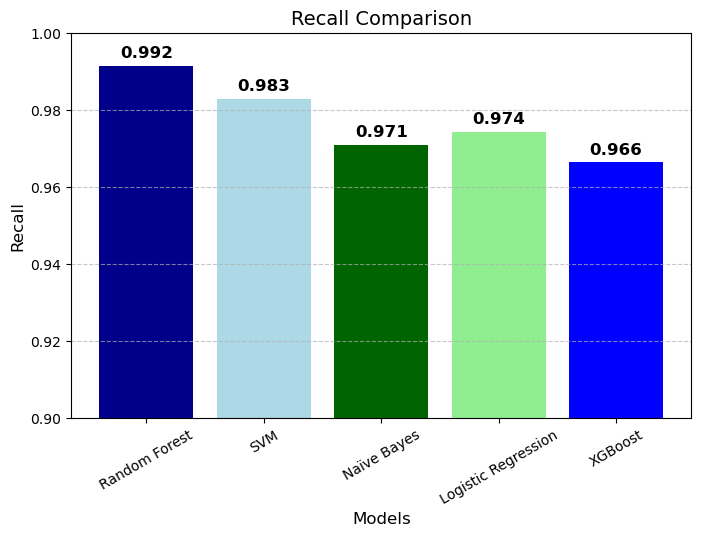

In [183]:
# Define recall scores
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
Models %	Accuracy
%	Precision
%	Recall
%	F1 score
%
RF	97.84%
	98.23%	98.23%	97.80%
LR	96.55%
	96.46%	96.46%	96.46%
XGB	94.83%
	94.69%	94.69%	94.69%
NB	97.41%
	97.35%	97.35%	97.35%
SVM	97.41%
	96.52%	98.23%	97.37%

recall_scores = [0.9915, 0.9829, 0.971, 0.9744, 0.9664]  

# Creating bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, recall_scores, color=colors)

# Adding values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

#Adding Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.title('Recall Comparison', fontsize=14)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


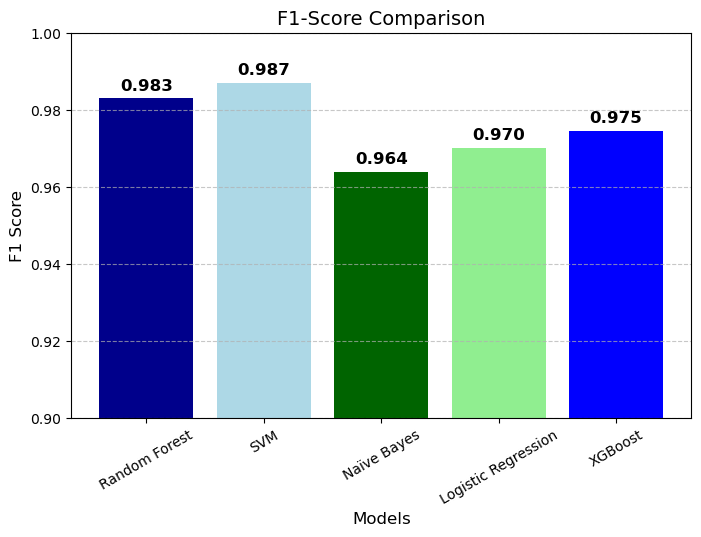

In [181]:
# Define F1-score values
models = ['Random Forest', 'SVM', 'Naïve Bayes', 'Logistic Regression', 'XGBoost']
f1_scores = [0.9831, 0.9871, 0.964, 0.9702, 0.9746]  

# Create bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(models, f1_scores, color=colors)

# Add values on bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.002, f"{yval:.3f}", 
             ha='center', fontsize=12, fontweight='bold', color='black')

# Labels and title
plt.xlabel('Models', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.title('F1-Score Comparison', fontsize=14)
plt.ylim(0.9, 1.0)
plt.xticks(rotation=30, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


# MODEL  PERFORMANCE AFTER BALANCING THE DATASET

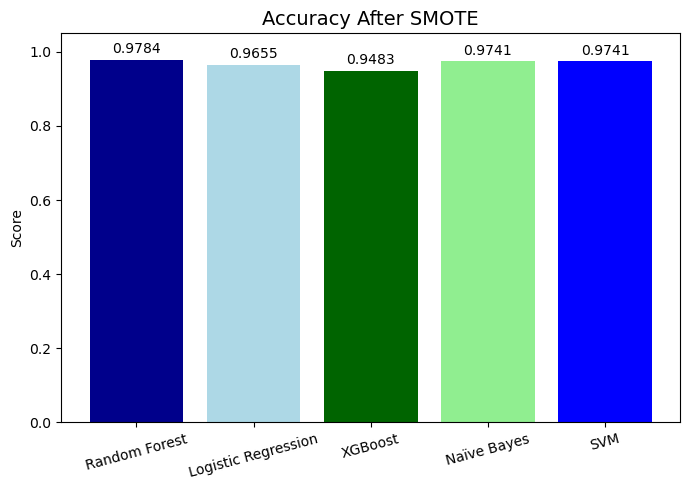

In [207]:
# Model names
models = ['Random Forest', 'Logistic Regression', 'XGBoost', 'Naïve Bayes', 'SVM']

# Accuracy values from your screenshots
accuracy = [0.9784, 0.9655, 0.9483, 0.9741, 0.9741]

# Custom colors
colors = ['darkblue', 'lightblue', 'darkgreen', 'lightgreen', 'blue']

# Create bar chart
plt.figure(figsize=(7, 5))
bars = plt.bar(models, accuracy, color=colors)
plt.ylim(0, 1.05)
plt.title('Accuracy After SMOTE', fontsize=14)
plt.ylabel('Score')
plt.xticks(rotation=15)

# Annotate bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


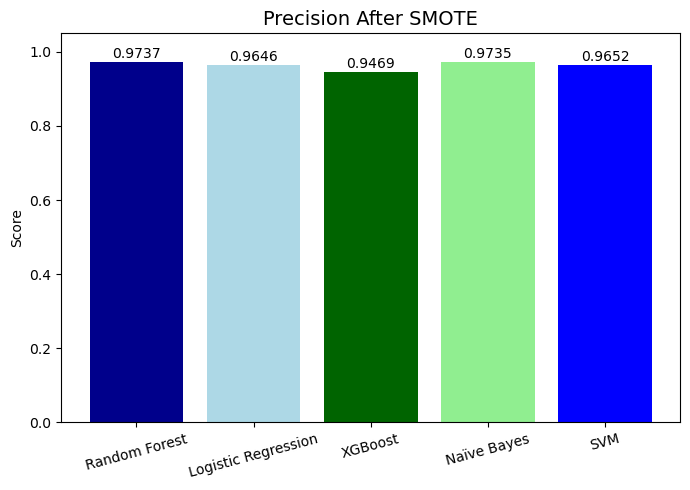

In [206]:

models = ['Random Forest', 'Logistic Regression', 'XGBoost', 'Naïve Bayes', 'SVM']
precision = [0.9737, 0.9646, 0.9469, 0.9735, 0.9652]
colors = ['darkblue', 'lightblue', 'darkgreen', 'lightgreen', 'blue']

plt.figure(figsize=(7, 5))
bars = plt.bar(models, precision, color=colors)
plt.ylim(0, 1.05)
plt.title('Precision After SMOTE', fontsize=14)
plt.ylabel('Score')
plt.xticks(rotation=15)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center')

plt.tight_layout()
plt.show()


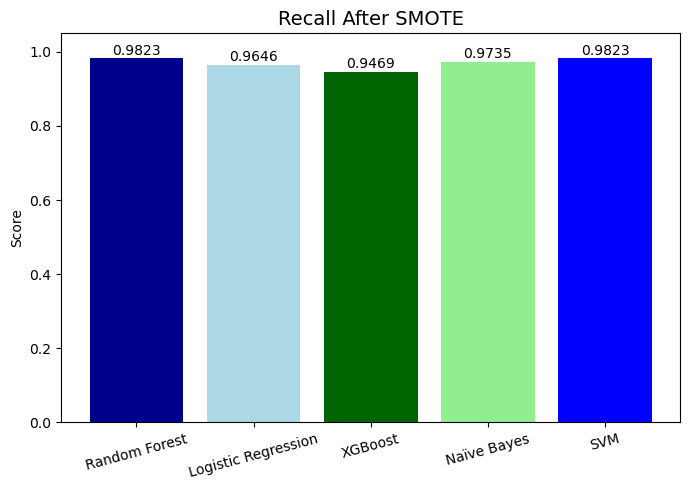

In [209]:
recall = [0.9823, 0.9646, 0.9469, 0.9735, 0.9823]

plt.figure(figsize=(7, 5))
bars = plt.bar(models, recall, color=colors)
plt.ylim(0, 1.05)
plt.title('Recall After SMOTE', fontsize=14)
plt.ylabel('Score')
plt.xticks(rotation=15)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center')

plt.tight_layout()
plt.show()


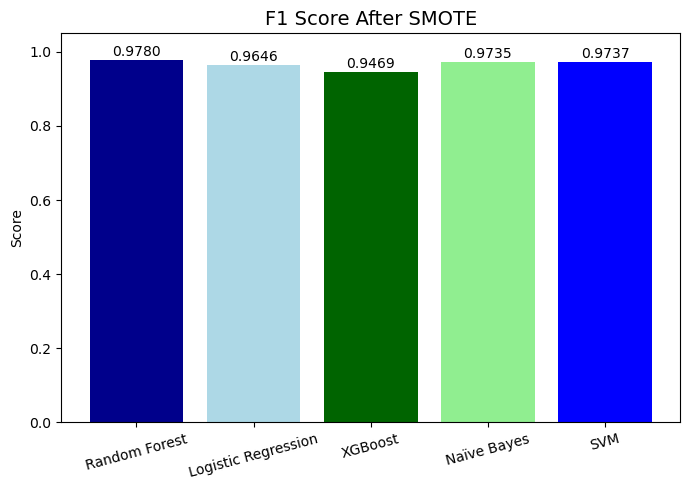

In [210]:
f1_scores = [0.9780, 0.9646, 0.9469, 0.9735, 0.9737]

plt.figure(figsize=(7, 5))
bars = plt.bar(models, f1_scores, color=colors)
plt.ylim(0, 1.05)
plt.title('F1 Score After SMOTE', fontsize=14)
plt.ylabel('Score')
plt.xticks(rotation=15)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center')

plt.tight_layout()
plt.show()


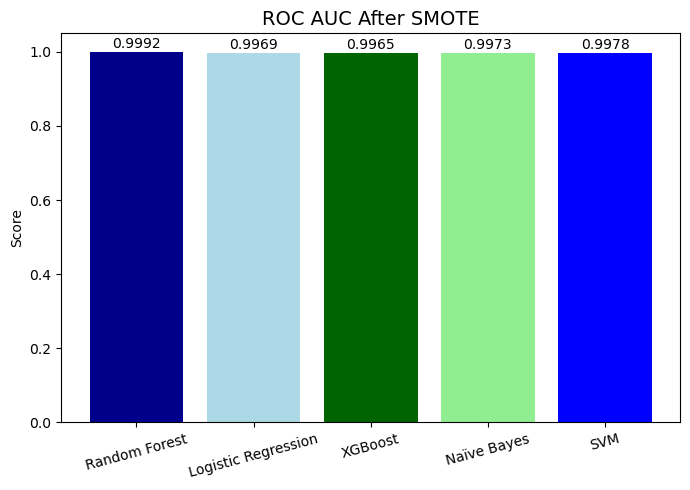

In [211]:
roc_auc = [0.9992, 0.9969, 0.9965, 0.9973, 0.9978]

plt.figure(figsize=(7, 5))
bars = plt.bar(models, roc_auc, color=colors)
plt.ylim(0, 1.05)
plt.title('ROC AUC After SMOTE', fontsize=14)
plt.ylabel('Score')
plt.xticks(rotation=15)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f'{height:.4f}', ha='center')

plt.tight_layout()
plt.show()


#  Evaluation Results of ML Algorithms (Original Data)

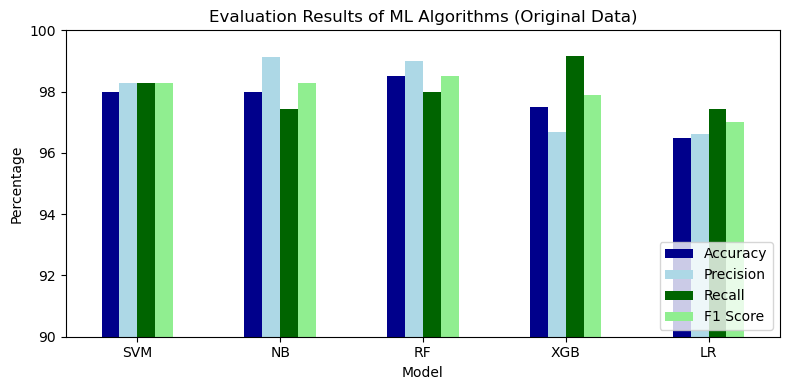

In [2]:
# Original data
data1 = {
    "Model": ["SVM", "NB", "RF", "XGB", "LR"],
    "Accuracy": [98.00, 98.00, 98.50, 97.50, 96.50],
    "Precision": [98.29, 99.13, 99.00, 96.67, 96.61],
    "Recall": [98.29, 97.44, 98.00, 99.15, 97.44],
    "F1 Score": [98.29, 98.28, 98.50, 97.89, 97.02]
}

df1 = pd.DataFrame(data1)
colors = ['darkblue', 'lightblue', 'darkgreen', 'lightgreen']

df1.set_index("Model").plot(kind="bar", figsize=(8, 4), color=colors)
plt.title("Evaluation Results of ML Algorithms (Original Data)")
plt.ylabel("Percentage")
plt.ylim(90, 100)
plt.xticks(rotation=0)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


#  Performance Metrics After SMOTE Application


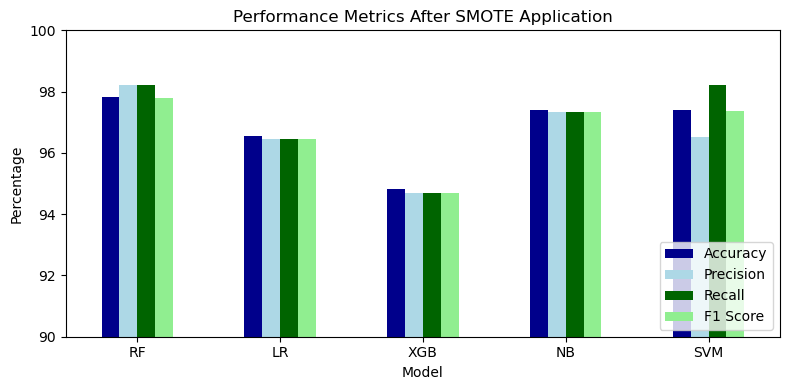

In [4]:
# SMOTE-applied data
data2 = {
    "Model": ["RF", "LR", "XGB", "NB", "SVM"],
    "Accuracy": [97.84, 96.55, 94.83, 97.41, 97.41],
    "Precision": [98.23, 96.46, 94.69, 97.35, 96.52],
    "Recall": [98.23, 96.46, 94.69, 97.35, 98.23],
    "F1 Score": [97.80, 96.46, 94.69, 97.35, 97.37]
}

df2 = pd.DataFrame(data2)

df2.set_index("Model").plot(kind="bar", figsize=(8, 4), color=colors)
plt.title("Performance Metrics After SMOTE Application")
plt.ylabel("Percentage")
plt.ylim(90, 100)
plt.xticks(rotation=0)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


# Model Performance After Feature Removal

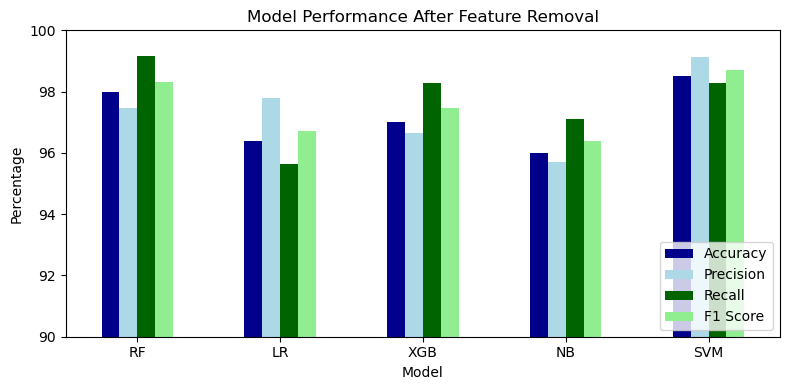

In [6]:
# Feature-removed data
data3 = {
    "Model": ["RF", "LR", "XGB", "NB", "SVM"],
    "Accuracy": [98.00, 96.40, 97.00, 96.00, 98.50],
    "Precision": [97.48, 97.78, 96.64, 95.71, 99.14],
    "Recall": [99.15, 95.65, 98.29, 97.10, 98.29],
    "F1 Score": [98.31, 96.70, 97.46, 96.40, 98.71]
}

df3 = pd.DataFrame(data3)

df3.set_index("Model").plot(kind="bar", figsize=(8, 4), color=colors)
plt.title("Model Performance After Feature Removal")
plt.ylabel("Percentage")
plt.ylim(90, 100)
plt.xticks(rotation=0)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()
